In [1]:
import tensorflow as tf
import os
import numpy as np
import matplotlib.pyplot as plt
import time
import cv2
from tensorflow.keras import layers
from keras.models import Model, Sequential
from keras.layers import Dense, Conv2D, Flatten, BatchNormalization, LeakyReLU
from keras.layers import Conv2DTranspose, Dropout, ReLU, Input, Concatenate, ZeroPadding2D
from keras.optimizers import Adam
from keras.utils import plot_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow_addons as tfa

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


In [2]:
import tensorflow as tf

physical_devices = tf.config.list_physical_devices('GPU')
if len(physical_devices) == 0:
    print("No GPU devices found. Make sure your GPU is properly installed and configured.")
else:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
    print("GPU configured successfully.")

GPU configured successfully.


In [3]:
import tensorflow as tf

# Check available GPUs
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    # Restrict TensorFlow to only allocate GPU memory growth
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
        print("GPU memory growth set to True")
    except RuntimeError as e:
        print(e)

GPU memory growth set to True


In [4]:
import tensorflow as tf

# Check if TensorFlow can access GPU
num_gpus = len(tf.config.experimental.list_physical_devices('GPU'))

if num_gpus > 0:
    print("Num GPUs Available: ", num_gpus)
    print("TensorFlow is using GPU.")
else:
    print("No GPU available. TensorFlow is using CPU.")


Num GPUs Available:  1
TensorFlow is using GPU.


In [5]:
def load(image_file):
    image = tf.io.read_file(image_file)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.cast(image,tf.float32)
    return image

In [6]:
path = "/kaggle/input/monumentimagenotaugmented/"
x = load(os.path.join(path, 'train/Train_3221.jpg'))
print(x.shape)

(300, 300, 3)


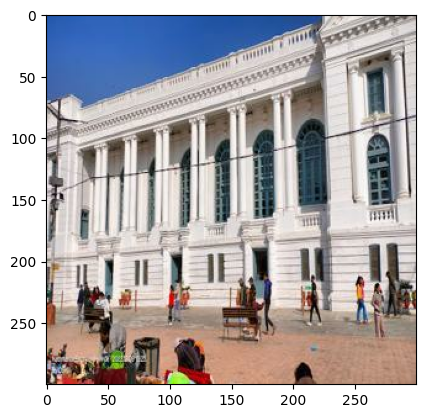

In [7]:
plt.imshow(x/255.0)

In [8]:
def normalize(real_image):
    real_image = (real_image / 255)
    return real_image

In [9]:
def random_crop(real_image):
    cropped_image = tf.image.random_crop(real_image, size = [256, 256, 3])
    return cropped_image

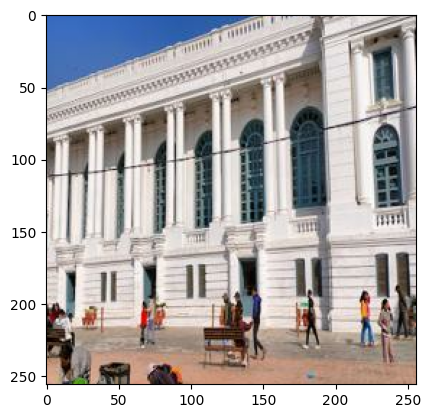

In [10]:
x_aug = random_crop(x)
plt.imshow(x_aug/255.0)

In [11]:
def resize(real_image):
    real_image = tf.image.resize(real_image, [256, 256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    return real_image

In [12]:
def rotate_image(image, angles, interpolation='BILINEAR'):
    """
    Rotate an image tensor by specified angles.

    Args:
    - image: Input image tensor with shape (batch_size, height, width, channels).
    - angles: Tensor of rotation angles in radians for each image in the batch.
    - interpolation: Interpolation method ('BILINEAR' or 'NEAREST').

    Returns:
    - Rotated image tensor.
    """
    batch_size, height, width, channels = tf.unstack(tf.shape(image))

    # Coordinates of the center of the image
    center_x = tf.cast(width, tf.float32) / 2.0
    center_y = tf.cast(height, tf.float32) / 2.0

    # Define transformation matrix
    rotation_matrix = tf.reshape(tf.stack([tf.cos(angles), -tf.sin(angles), center_x * (1 - tf.cos(angles)) + center_y * tf.sin(angles),
                                           tf.sin(angles), tf.cos(angles), -center_x * tf.sin(angles) + center_y * (1 - tf.cos(angles)),
                                           0.0, 0.0, 1.0], axis=1), shape=(-1, 3, 3))

    # Apply rotation to each pixel
    rotated_image = tfa.image.transform(image, rotation_matrix, interpolation)

    return rotated_image


In [13]:
def random_jitter(real_image):
    if tf.random.uniform(()) > 0.5:
        real_image = tf.image.flip_left_right(real_image)
    return real_image

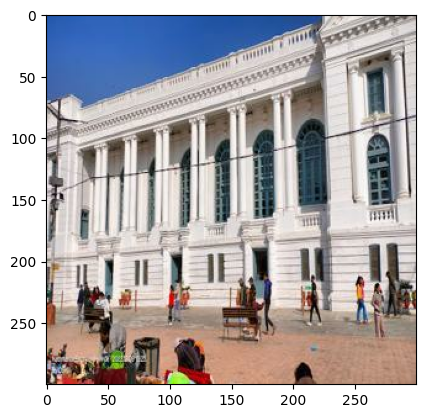

In [14]:
x_jitter = random_jitter(x)
plt.imshow(x_jitter/255.0)

In [15]:
def load_train_images(image_path):
    real_image = load(image_path)
    real_image = tf.image.random_brightness(real_image, 0.2)
    real_image = random_crop(real_image)
    # Define the rotation angle in radians
    rotation_angle = tf.constant(20.0 * (3.141592653589793 / 180.0), dtype=tf.float32)

    # Apply the rotation using tfa.image.rotate
    real_image = tfa.image.rotate(real_image, angles=rotation_angle)

#     # Example usage
#     angles = tf.placeholder(dtype=tf.float32, shape=(None,))
#     # Specify the rotation range in degrees
#     rotation_range = 15  # Adjust this value as needed
#     # Convert the rotation range to radians
#     rotation_range_rad = rotation_range * (np.pi / 180.0)
#     # Generate random rotation angles for each image in the batch
#     random_angles = tf.random.uniform(shape=(tf.shape(image)[0],), minval=-rotation_range_rad, maxval=rotation_range_rad)
#     # Apply custom rotation to the image with bilinear interpolation
#     real_image = rotate_image(real_image, random_angles, interpolation='BILINEAR')
    #     real_image = rotate(real_image)
    real_image = random_jitter(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:]  # AB channels
    #here L_channel becomes input i.e light/luminance of pixel and AB_channels become target
    return Y_channel, UV_channels

In [16]:
def load_test_image(image_path):
    real_image = load(image_path)
    real_image = resize(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:]  # AB channels
    #here L_channel becomes input i.e light/luminance of pixel and AB_channels become target
    return Y_channel, UV_channels

In [17]:
IMAGE_SIZE = 256
BATCH_SIZE = 32

In [18]:
# create input pipeline
train_dataset = tf.data.Dataset.list_files(path + "train/*.jpg")
train_dataset = train_dataset.map(load_train_images)
train_dataset = train_dataset.shuffle(10).batch(BATCH_SIZE)
train_dataset

<_BatchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 1), dtype=tf.float32, name=None), TensorSpec(shape=(None, 256, 256, 2), dtype=tf.float32, name=None))>

In [19]:
test_dataset = tf.data.Dataset.list_files(path + 'val/*.jpg')
test_dataset = test_dataset.map(load_test_image)
test_dataset = test_dataset.batch(BATCH_SIZE)
test_dataset

<_BatchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 1), dtype=tf.float32, name=None), TensorSpec(shape=(None, 256, 256, 2), dtype=tf.float32, name=None))>

In [20]:
# downsample block
def downsample(filters, size,dropout=False, batchnorm = True):
    init = tf.random_normal_initializer(0.,0.02)
    result = Sequential()
    result.add(Conv2D(filters, size, strides = 2, padding = "same", kernel_initializer = init, use_bias = False))
    if batchnorm == True:
        result.add(BatchNormalization())
    if dropout == True :
        result.add(Dropout(0.3))
    result.add(LeakyReLU())
    return result
down_model = downsample(3,4)
down_result = down_model(tf.expand_dims(x, axis = 0))
print(down_result.shape)

(1, 150, 150, 3)


In [21]:
# upsample block
def upsample(filters, size, dropout = False):
    init = tf.random_normal_initializer(0, 0.02)
    result = Sequential()
    result.add(Conv2DTranspose(filters, size, strides = 2, padding = "same", kernel_initializer = init, use_bias = False))
    result.add(BatchNormalization())
    if dropout == True:
        result.add(Dropout(0.3))
    result.add(ReLU())
    return result
up_model = upsample(3,4)
up_result = up_model(down_result)
print(up_result.shape)

(1, 300, 300, 3)


In [22]:
def generator(input_shape = (256,256,1), output_channels = 2):
    inputs = Input(shape = input_shape)
    down_stack = [
        downsample(32, 4, batchnorm=False),
        downsample(64, 4),
        downsample(128, 4),
        downsample(256, 4, dropout = True),
        downsample(512, 4, dropout = True),
        downsample(1024, 4, dropout = True),
        downsample(1024, 4, dropout = True),
        downsample(1024, 4, dropout = True)
    ]


    up_stack = [
        upsample(1024, 4, dropout=True),
        upsample(1024, 4, dropout=True),
        upsample(512, 4, dropout=True),
        upsample(256, 4, dropout=True),
        upsample(128, 4, dropout=True),
        upsample(64, 4),
        upsample(32, 4),
    ]
    init = tf.random_normal_initializer(0., 0.02)
    last = Conv2DTranspose(2, 4, strides = 2, padding = "same", kernel_initializer = init, activation ="tanh")
    x = inputs
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
    skips = reversed(skips[:-1])

    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = Concatenate()([x, skip])

    x = last(x)
    return Model(inputs = inputs, outputs = x)

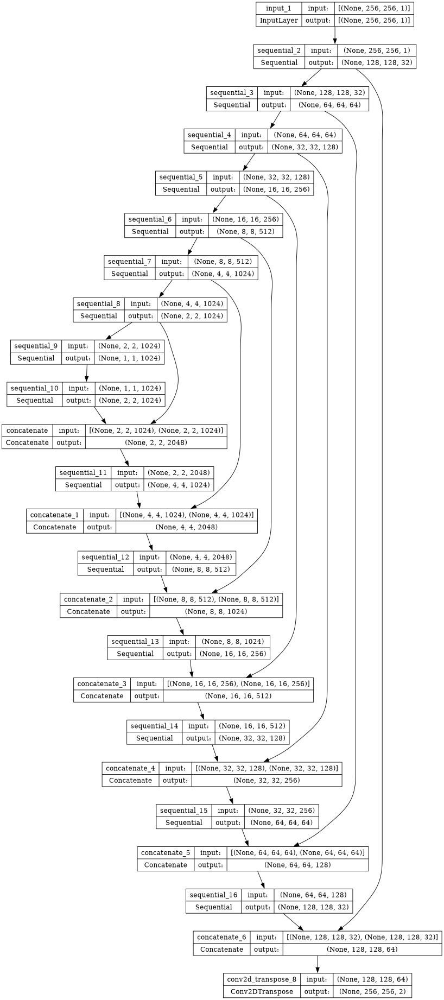

In [23]:
gen = generator()
plot_model(gen, show_shapes=True, dpi = 64)

In [24]:
def discriminator():
    init = tf.random_normal_initializer(0., 0.02)
    tar = Input(shape = [IMAGE_SIZE, IMAGE_SIZE, 2], name = "target_image")
    down1 = downsample(64,4,False)(tar)
    down2 = downsample(128, 4)(down1)
    down3 = downsample(256, 4)(down2)

    zero_pad1 = ZeroPadding2D()(down3)
    conv = Conv2D(256, 4, strides = 1, kernel_initializer = init, use_bias = False)(zero_pad1)
    leaky_relu = LeakyReLU()(conv)
    zero_pad2 = ZeroPadding2D()(leaky_relu)
    last = Conv2D(1, 4, strides = 1, kernel_initializer=init)(zero_pad2)
    return Model(inputs = tar, outputs = last)

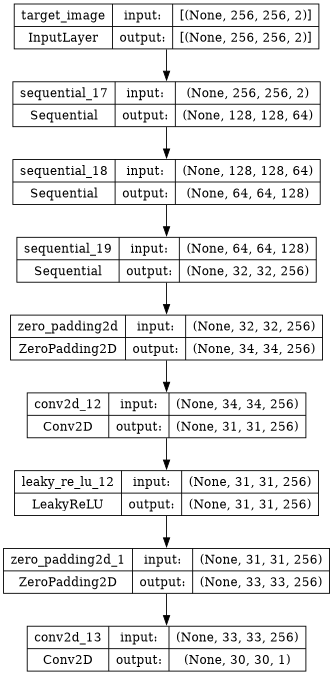

In [25]:
disc = discriminator()
plot_model(disc, show_shapes=True, dpi = 64)

In [26]:
# Function to create YUV image from Y, U, and V channels and then convert to rgb
def create_rgb_image(y_channel, uv_channel):
    # Assuming YUV format where Y, U, and V channels are separate
    # y_channel = np.array(y_channel)
    # uv_channel = np.array(uv_channel)
    u_channel, v_channel = tf.split(uv_channel, num_or_size_splits=2, axis=-1)

    # Combine Y, U, and V channels into a YUV image
    rgb_image = tf.image.yuv_to_rgb(tf.concat([y_channel, u_channel, v_channel], axis=-1))
    return rgb_image


In [27]:
from tensorflow.keras.applications import VGG19
from tensorflow.keras.losses import BinaryCrossentropy, MeanAbsoluteError, MeanSquaredError

# Define generator and discriminator architectures
# Define generator and discriminator models

# Load pre-trained VGG19 model for perceptual loss
# vgg_model = VGG19(weights='imagenet', include_top=False)

# Define loss functions
bce_loss = BinaryCrossentropy(from_logits=True)
mae_loss = MeanAbsoluteError()
mse_loss = MeanSquaredError()

In [28]:
lambda_adv = 1
lambda_l1 = 120
lambda_l2 = 50
lambda_perceptual = 0.2

In [29]:
# def perceptual_loss(y_true, y_pred):
#     y_true = tf.keras.applications.vgg19.preprocess_input(y_true)
#     y_pred = tf.keras.applications.vgg19.preprocess_input(y_pred)
#     features_true = vgg_model(y_true)
#     features_pred = vgg_model(y_pred)
#     return mae_loss(features_true, features_pred)


In [30]:
def generator_loss(disc_generated_output, input_image, generated_images, real_images):
    adv_loss = bce_loss(tf.ones_like(disc_generated_output), disc_generated_output)

    # Compute L1 loss
    l1_loss = mae_loss(real_images, generated_images)

    # Compute L2 loss
    l2_loss = mse_loss(real_images, generated_images)

    # Compute perceptual loss
#     perceptual_loss_val = perceptual_loss(create_rgb_image(input_image, real_images), create_rgb_image(input_image,generated_images))

    # Total generator loss
    gen_loss =  lambda_adv * adv_loss + lambda_l1 * l1_loss + lambda_l2 * l2_loss

    return gen_loss, adv_loss, l1_loss, l2_loss, 0

In [31]:
from keras.losses import BinaryCrossentropy
loss_function = BinaryCrossentropy(from_logits=True)

In [32]:
def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = loss_function(tf.ones_like(disc_real_output), disc_real_output)
    generated_loss = loss_function(tf.zeros_like(disc_generated_output), disc_generated_output)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss, real_loss, generated_loss

In [33]:
generator_optimizer = Adam(lr= 2e-4, beta_1=0.5)
discriminator_optimizer = Adam(lr = 2e-4, beta_1=0.5)

In [34]:
epochs = 200

In [35]:
@tf.function
def train_step(input_image, target, epoch, training_discriminator):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = gen(input_image, training=True)
        disc_real_output = disc( target, training=True)
        disc_generated_output = disc(gen_output, training=True)
        gen_total_loss, gen_adv_loss, gen_l1_loss, gen_l2_loss, gen_perceptual_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
        disc_loss, disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)

        ssim_values = tf.image.ssim(create_rgb_image(input_image, target), create_rgb_image(input_image,gen_output), max_val=1.0)
        psnr_values = tf.image.psnr(create_rgb_image(input_image, target), create_rgb_image(input_image,gen_output), max_val=1.0)
        if epoch > 10:
            if training_discriminator:
                discriminator_gradients = disc_tape.gradient(disc_loss, disc.trainable_variables)
                discriminator_optimizer.apply_gradients(zip(discriminator_gradients, disc.trainable_variables))
            else:
                generator_gradients = gen_tape.gradient(gen_total_loss, gen.trainable_variables)
                generator_optimizer.apply_gradients(zip(generator_gradients, gen.trainable_variables))
        else:
            generator_gradients = gen_tape.gradient(gen_total_loss, gen.trainable_variables)
            discriminator_gradients = disc_tape.gradient(disc_loss, disc.trainable_variables)
            generator_optimizer.apply_gradients(zip(generator_gradients, gen.trainable_variables))
            discriminator_optimizer.apply_gradients(zip(discriminator_gradients, disc.trainable_variables))

        return gen_total_loss, gen_adv_loss, gen_l1_loss, gen_l2_loss, gen_perceptual_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, psnr_values

In [36]:
@tf.function
def test_step(input_image, target):
    # Generate output using the generator
    gen_output = gen(input_image)

    # Calculate losses without updating gradients
    disc_real_output = disc( target)
    disc_generated_output = disc(gen_output)

    gen_total_loss, gen_adv_loss, gen_l1_loss, gen_l2_loss, gen_perceptual_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
    disc_loss,disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)

    ssim_values = tf.image.ssim(create_rgb_image(input_image, target), create_rgb_image(input_image,gen_output), max_val=1.0)
    psnr_values = tf.image.psnr(create_rgb_image(input_image, target), create_rgb_image(input_image,gen_output), max_val=1.0)
    #accuracy = calculate_accuracy(disc_generated_output, disc_real_output)
    return gen_total_loss, gen_adv_loss, gen_l1_loss, gen_l2_loss, gen_perceptual_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, psnr_values

In [37]:
os.mkdir('/kaggle/working/gen_output/')

In [38]:
def display_one_random_test_image(input_, target, gen_model, epoch):
    print("Displaying one random test image...")
    img_array = np.array(input_)
    generated_output_test = gen_model(input_)
    ssim = tf.image.ssim(tf.reshape(create_rgb_image(input_, target), (256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (256,256,3)), max_val=1.0)
    psnr = tf.image.psnr(tf.reshape(create_rgb_image(input_, target), (256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (256,256,3)), max_val=1.0)  
    # print(input_.shape)
    input_ = np.squeeze(input_, axis=0)
    # print(type(input_), type(target))
    # print(input_.shape, input_)
    # input_.reshape((256,256))
    plt.figure(figsize=(16, 16))
    plt.subplot(1, 4, 1)
    plt.title('Input Testing Image')
    plt.imshow(input_, cmap='gray', vmax = 1, vmin = 0)  # Assuming images are normalized to [0, 1]
    plt.axis('off')
    # # print(target.shape)
    target = np.squeeze(target, axis=0)
    # # print(target.shape)
    target_img = create_rgb_image(input_, target).numpy()
    # # print(type(target_img))
    # target
    # # print(target_img.shape, target_img)
    plt.subplot(1, 4, 2)
    plt.title('Target Testing Image')
    plt.imshow(target_img)  # Assuming images are normalized to [0, 1]
    plt.axis('off')
    # # Convert PIL Image to NumPy array
    # img_array = np.array(input_)
    # # Add batch dimension
    # # print(img_array.shape)
    # img_array = np.expand_dims(img_array, axis=0)
    # # print(img_array.shape)
    # generated_output_test = gen_model(img_array)
    # # print(generated_output_test.shape)
    # # Squeeze the singleton dimension
    generated_output_test = np.squeeze(generated_output_test, axis=0)
    # # print(generated_output_test.shape)
    generated_img = create_rgb_image(input_, generated_output_test).numpy()
    # # print(generated_img.shape, generated_img)
    plt.subplot(1, 4, 3)
    plt.title(f'Generated Output -- epoch {epoch}')
    plt.imshow(generated_img)  # Assuming images are normalized to [-1, 1]
    plt.axis('off')
    plt.savefig(f'/kaggle/working/gen_output/epoch_{epoch}.png')
    plt.show()
    print('SSIM Score: {}'.format(ssim))
    print('PSNR Score: {}'.format(psnr))

In [39]:
def display_random_test_image(test_ds, gen_model, epoch):
    # Shuffle the dataset and take one batch
    random_test_batch = test_ds.shuffle(buffer_size=len(test_ds)).take(1)

    # Extract input and target from the batch
    random_test_input, random_test_target = list(random_test_batch)[0]

    # Display the image
    display_one_random_test_image(tf.reshape(random_test_input[0], (1,256,256,1)),tf.reshape(random_test_target[0],(1,256,256,2)), gen_model, epoch)
display_random_test_image

<function __main__.display_random_test_image(test_ds, gen_model, epoch)>

Displaying one random test image...


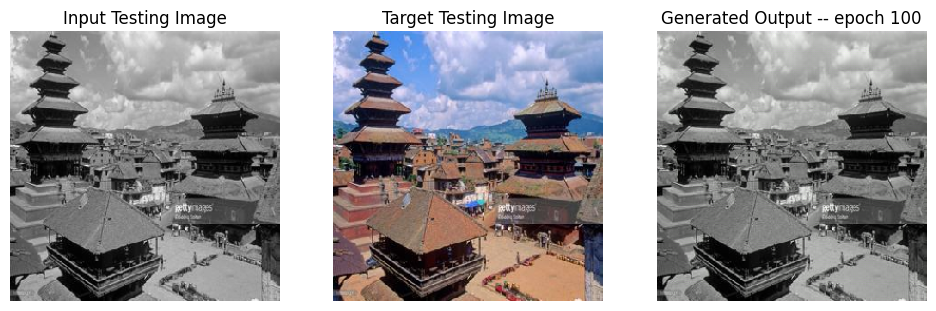

SSIM Score: 0.9297571182250977
PSNR Score: 20.354148864746094


In [40]:
display_random_test_image(test_dataset , gen,100)

In [41]:
import random
from tqdm import tqdm

each_epoch_train_generator_losses = []
each_epoch_train_generator_gan_losses = []
each_epoch_train_generator_l1_losses = []
each_epoch_train_generator_l2_losses = []
each_epoch_train_generator_perceptual_losses = []
each_epoch_train_discriminator_losses = []
each_epoch_train_discriminator_real_losses = []
each_epoch_train_discriminator_generated_losses = []
each_epoch_train_ssim = []
each_epoch_train_psnr = []
each_epoch_test_psnr = []
each_epoch_test_ssim = []
each_epoch_test_generator_losses = []
each_epoch_test_generator_gan_losses = []
each_epoch_test_generator_l1_losses = []
each_epoch_test_generator_l2_losses = []
each_epoch_test_generator_perceptual_losses = []
each_epoch_test_discriminator_losses = []
each_epoch_test_discriminator_real_losses = []
each_epoch_test_discriminator_generated_losses = []
train_generator_losses = []
train_generator_gan_losses = []
train_generator_l1_losses = []
train_generator_l2_losses = []
train_generator_perceptual_losses = []
train_discriminator_losses = []
train_discriminator_real_losses = []
train_discriminator_generated_losses = []
test_generator_losses = []
test_generator_gan_losses = []
test_generator_l1_losses = []
test_generator_l2_losses = []
test_generator_perceptual_losses = []
test_discriminator_losses = []
test_discriminator_real_losses = []
test_discriminator_generated_losses =[]
training_ssim = []
training_psnr = []
testing_ssim = []
testing_psnr = []
each_epoch_all_records = []
all_records = []
def fit(train_ds, epochs, test_ds, gen_model):

    # Declare global lists
    global each_epoch_train_generator_losses, each_epoch_train_generator_gan_losses, each_epoch_train_generator_l1_losses, each_epoch_train_generator_l2_losses, each_epoch_train_generator_perceptual_losses, each_epoch_train_discriminator_losses,each_epoch_train_discriminator_real_losses, each_epoch_train_discriminator_generated_losses, each_epoch_train_ssim, each_epoch_train_psnr
    global each_epoch_test_psnr, each_epoch_test_ssim, each_epoch_test_generator_losses, each_epoch_test_generator_gan_losses, each_epoch_test_generator_l1_losses, each_epoch_test_generator_l2_losses, each_epoch_test_generator_perceptual_losses, each_epoch_test_discriminator_losses, each_epoch_test_discriminator_real_losses, each_epoch_test_discriminator_generated_losses
    global train_generator_losses, train_generator_gan_losses, train_generator_l1_losses, train_generator_l2_losses, train_generator_perceptual_losses, train_discriminator_losses, train_discriminator_real_losses, train_discriminator_generated_losses, test_generator_losses, test_generator_l2_losses, test_generator_gan_losses, test_generator_l1_losses, test_generator_perceptual_losses, test_discriminator_losses, test_discriminator_real_losses, test_discriminator_generated_losses
    global training_ssim, training_psnr, testing_ssim, testing_psnr, each_epoch_all_records, all_records, LAMBDA


    # Initialize counters and flags
    consecutive_epochs_high_loss = 0
    training_discriminator = True
    stop_training = False
    min_learning_rate = 1e-7  # Set your desired minimum learning rate

    for epoch in range(epochs):
        start = time.time()
        train_count = 0
        test_count = 0
        
        # Initialize tqdm to track progress
        progress_bar_train = tqdm(total=len(train_ds), desc=f'Epoch {epoch + 1}/{epochs}', unit='batches')
        progress_bar_test = tqdm(total=len(test_ds), desc=f'Epoch {epoch + 1}/{epochs}', unit='batches')

        
        print(f"Epoch {epoch}")

        for n, (input_, target) in train_ds.enumerate():
            if epoch > 10:
                train_gen_loss, train_gen_gan_loss, train_gen_l1_loss,train_gen_l2_loss, train_gen_perceptual_loss, train_disc_loss, train_disc_real_loss, train_disc_generated_loss, train_ssim, train_psnr = train_step(input_, target, epoch, training_discriminator=training_discriminator)

            else:
                # If epoch is less than or equal to 10, train both generator and discriminator
                train_gen_loss, train_gen_gan_loss, train_gen_l1_loss,train_gen_l2_loss, train_gen_perceptual_loss, train_disc_loss, train_disc_real_loss, train_disc_generated_loss, train_ssim, train_psnr  = train_step(input_, target, epoch, training_discriminator=None)

            each_epoch_train_generator_losses.append(train_gen_loss)
            each_epoch_train_generator_gan_losses.append(train_gen_gan_loss)
            each_epoch_train_generator_l1_losses.append(train_gen_l1_loss)
            each_epoch_train_generator_l2_losses.append(train_gen_l2_loss)
            each_epoch_train_generator_perceptual_losses.append(train_gen_perceptual_loss)
            each_epoch_train_discriminator_losses.append(train_disc_loss)
            each_epoch_train_discriminator_real_losses.append(train_disc_real_loss)
            each_epoch_train_discriminator_generated_losses.append(train_disc_generated_loss)
            each_epoch_train_ssim.append(tf.reduce_mean(train_ssim.numpy()))
            each_epoch_train_psnr.append(tf.reduce_mean(train_psnr.numpy()))
            train_count += 1
            
            progress_bar_train.update(1)

        #each_epoch_train_generator_losses = np.array(each_epoch_train_generator_losses)
        #print(each_epoch_train_discriminator_losses.shape())
        #print(each_epoch_train_generator_losses.shape())
        #print(each_epoch_train_ssim())
        print("Training Details")
        print("Generator-- total_loss:{:.2f} gan_loss:{:.2f} l1_loss:{:.2f} l2_loss:{:.2f} perceptual_loss:{:.2f} Discriminator-- total_loss:{:.2f} real_loss:{:.2f} generated_loss:{:.2f} --- SSIM {:.2f} PSNR {:.2f}".format(np.mean(each_epoch_train_generator_losses),np.mean(each_epoch_train_generator_gan_losses), np.mean(each_epoch_train_generator_l1_losses),np.mean(each_epoch_train_generator_l2_losses),np.mean(each_epoch_train_generator_perceptual_losses), np.mean(each_epoch_train_discriminator_losses), np.mean(each_epoch_train_discriminator_generated_losses), np.mean(each_epoch_train_discriminator_real_losses), np.mean(each_epoch_train_ssim), np.mean(each_epoch_train_psnr)))
        print("Time taken for epoch {} is {} sec".format(epoch + 1, time.time() - start))
        print(f"Number of iteration {train_count}")
        progress_bar_train.close()
        train_generator_losses.append(np.mean(each_epoch_train_generator_losses))
        train_generator_gan_losses.append(np.mean(each_epoch_train_generator_gan_losses))
        train_generator_l1_losses.append(np.mean(each_epoch_train_generator_l1_losses))
        train_generator_l2_losses.append(np.mean(each_epoch_train_generator_l2_losses))
        train_generator_perceptual_losses.append(np.mean(each_epoch_train_generator_perceptual_losses))
        train_discriminator_losses.append(np.mean(each_epoch_train_discriminator_losses))
        train_discriminator_real_losses.append(np.mean(each_epoch_train_discriminator_real_losses))
        train_discriminator_generated_losses.append(np.mean(each_epoch_train_discriminator_generated_losses))
        training_ssim.append(np.mean(each_epoch_train_ssim))
        training_psnr.append(np.mean(each_epoch_train_psnr))

        # Test
        for n, (input_, target) in test_ds.enumerate():
            test_gen_loss, test_gen_gan_loss, test_gen_l1_loss,test_gen_l2_loss, test_gen_perceptual_loss, test_disc_loss, test_disc_real_loss, test_disc_generated_loss, test_ssim, test_psnr = test_step(input_, target)
            test_count += 1

            each_epoch_test_generator_losses.append(test_gen_loss)
            each_epoch_test_generator_gan_losses.append(test_gen_gan_loss)
            each_epoch_test_generator_l1_losses.append(test_gen_l1_loss)
            each_epoch_test_generator_l2_losses.append(test_gen_l2_loss)
            each_epoch_test_generator_perceptual_losses.append(test_gen_perceptual_loss)
            each_epoch_test_discriminator_losses.append(test_disc_loss)
            each_epoch_test_discriminator_real_losses.append(test_disc_real_loss)
            each_epoch_test_discriminator_generated_losses.append(test_disc_generated_loss)
            each_epoch_test_ssim.append(tf.reduce_mean(test_ssim.numpy()))
            each_epoch_test_psnr.append(tf.reduce_mean(test_psnr.numpy()))
            progress_bar_test.update(1)

        print("Testing Details")
        print("Generator-- total_loss:{:.2f} gan_loss:{:.2f} l1_loss:{:.2f} l2_loss:{:.2f} perceptual_loss:{:.2f} Discriminator-- total_loss:{:.2f} real_loss:{:.2f} generated_loss:{:.2f} --- SSIM {:.2f} PSNR {:.2f}".format(np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses),np.mean(each_epoch_test_generator_l2_losses), np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr)))
        print("Time taken for epoch {} is {} sec".format(epoch+1, time.time() - start))
        print(f"Number of iteration {test_count}")
        progress_bar_test.close()
#         LAMBDA = LAMBDA * 1.006
        test_generator_losses.append(np.mean(each_epoch_test_generator_losses))
        test_generator_gan_losses.append(np.mean(each_epoch_test_generator_gan_losses))
        test_generator_l1_losses.append(np.mean(each_epoch_test_generator_l1_losses))
        test_generator_l2_losses.append(np.mean(each_epoch_test_generator_l2_losses))
        test_generator_perceptual_losses.append(np.mean(each_epoch_test_generator_perceptual_losses))
        test_discriminator_losses.append(np.mean(each_epoch_test_discriminator_losses))
        test_discriminator_real_losses.append(np.mean(each_epoch_test_discriminator_real_losses))
        test_discriminator_generated_losses.append(np.mean(each_epoch_test_discriminator_generated_losses))
        testing_ssim.append(np.mean(each_epoch_test_ssim))
        testing_psnr.append(np.mean(each_epoch_test_psnr))
        each_epoch_all_records.append([np.mean(each_epoch_train_generator_losses),np.mean(each_epoch_train_generator_gan_losses), np.mean(each_epoch_train_generator_l1_losses),np.mean(each_epoch_train_generator_l2_losses),np.mean(each_epoch_train_generator_perceptual_losses), np.mean(each_epoch_train_discriminator_losses), np.mean(each_epoch_train_discriminator_generated_losses), np.mean(each_epoch_train_discriminator_real_losses), np.mean(each_epoch_train_ssim), np.mean(each_epoch_train_psnr), np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses),np.mean(each_epoch_test_generator_l2_losses), np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr)])
        all_records.append(each_epoch_all_records)
        # emptying for next epoch
        each_epoch_test_ssim = []
        each_epoch_test_generator_losses = []
        each_epoch_test_generator_gan_losses = []
        each_epoch_test_generator_l1_losses = []
        each_epoch_test_generator_l2_losses = []
        each_epoch_test_generator_perceptual_losses = []
        each_epoch_test_discriminator_losses = []
        each_epoch_test_discriminator_real_losses = []
        each_epoch_test_discriminator_generated_losses = []
        each_epoch_test_psnr = []
        each_epoch_all_records = []
        #emptyling list for next iteration
        each_epoch_train_generator_losses = []
        each_epoch_train_generator_gan_losses = []
        each_epoch_train_generator_l1_losses = []
        each_epoch_train_generator_l2_losses = []
        each_epoch_train_generator_perceptual_losses = []
        each_epoch_train_discriminator_losses = []
        each_epoch_train_discriminator_real_losses = []
        each_epoch_train_discriminator_generated_losses = []
        each_epoch_train_ssim = []
        each_epoch_train_psnr = []
        if epoch == 0 or epoch % 5 == 0:
            # Function to display one random test image
            # def display_random_test_image(images, labels, gen_model):
            #     # Randomly select an index
            #     random_test_image_idx = random.randint(0, len(images) - 1)

            #     # Extract input and target from the selected index
            #     random_test_input = images[random_test_image_idx]
            #     random_test_target = labels[random_test_image_idx]

            #     # Display the image
            #     display_one_random_test_image(random_test_input, random_test_target, gen_model)

            # Example usage
            display_random_test_image(test_ds, gen_model, epoch+1)
        # Check if the difference between two consecutive epochs for the last 5 epochs is less than 1
        if epoch > 10:
            # Check 1f the difference between two consecutive epochs for the last S epochs is less than 1 or 0.3
            last_epochs_losses = train_discriminator_losses[-5:] if training_discriminator else train_generator_losses[-5:]
            if all(((last_epochs_losses[i] - last_epochs_losses[i - 1])) < 0.01 if training_discriminator else ((last_epochs_losses[1] - last_epochs_losses[i - 1])) < 0.05 for i in range(1, 5)):
                consecutive_epochs_high_loss += 1
            else:
                consecutive_epochs_high_loss = 0
        


#         LAMBDA = LAMBDA*1.003
            # If the condition is met for 2 consecutive epochs, reduce the learning rate
        if consecutive_epochs_high_loss == 2:
            if training_discriminator:
                current_lr = generator_optimizer. learning_rate.numpy()
                new_lr = max (current_lr * 0.6, min_learning_rate)
                if new_lr > min_learning_rate:
                    generator_optimizer.learning_rate.assign(new_lr)
                    print (f"Reduced generator learning rate to {new_lr} at epoch {epoch + 1}")
                    # Switch training focus
                    training_discriminator = not training_discriminator
                else:
                    print(f"Generator learning rate already at the minimum. Stopping training.")
                    stop_training = True
            else:
                current_lr = discriminator_optimizer.learning_rate.numpy()
                new_lr = max (current_lr * 0.4, min_learning_rate)
                if new_lr > min_learning_rate:
                    discriminator_optimizer.learning_rate.assign(new_lr)
                    print(f"Reduced discriminator learning rate to {new_lr} at epoch {epoch + 1}.")
                    # Switch training focus
                    training_discriminator = not training_discriminator
                else:
                    print(f"Discriminator learning rate already at the minimum. Stopping training.")
                    stop_training = True

                consecutive_epochs_high_loss = 0

        # Check the flag variable
        if stop_training:
            break

In [42]:
tf.config.run_functions_eagerly(True)

Epoch 1/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 0


Epoch 1/200: 100%|██████████| 245/245 [02:35<00:00,  1.58batches/s]


Training Details
Generator-- total_loss:8.53 gan_loss:2.42 l1_loss:0.05 l2_loss:0.01 perceptual_loss:0.00 Discriminator-- total_loss:0.98 real_loss:0.49 generated_loss:0.49 --- SSIM 0.84 PSNR 22.01
Time taken for epoch 1 is 155.1729030609131 sec
Number of iteration 245



Epoch 1/200: 100%|██████████| 70/70 [02:48<00:00,  2.41s/batches]


Testing Details
Generator-- total_loss:9.49 gan_loss:2.26 l1_loss:0.06 l2_loss:0.01 perceptual_loss:0.00 Discriminator-- total_loss:1.11 real_loss:0.18 generated_loss:0.94 --- SSIM 0.79 PSNR 21.04
Time taken for epoch 1 is 168.45828413963318 sec
Number of iteration 70
Displaying one random test image...


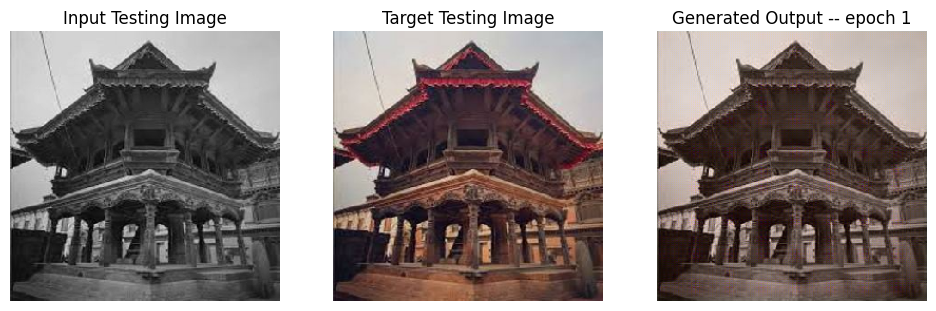

SSIM Score: 0.7676705718040466
PSNR Score: 24.620744705200195


Epoch 2/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 1


Epoch 2/200: 100%|██████████| 245/245 [02:29<00:00,  1.64batches/s]


Training Details
Generator-- total_loss:8.11 gan_loss:2.23 l1_loss:0.05 l2_loss:0.01 perceptual_loss:0.00 Discriminator-- total_loss:0.97 real_loss:0.46 generated_loss:0.51 --- SSIM 0.86 PSNR 22.16
Time taken for epoch 2 is 149.2863802909851 sec
Number of iteration 245



Epoch 2/200: 100%|██████████| 70/70 [02:41<00:00,  2.31s/batches]


Testing Details
Generator-- total_loss:10.01 gan_loss:2.21 l1_loss:0.06 l2_loss:0.01 perceptual_loss:0.00 Discriminator-- total_loss:1.88 real_loss:0.18 generated_loss:1.69 --- SSIM 0.83 PSNR 20.83
Time taken for epoch 2 is 161.74790787696838 sec
Number of iteration 70


Epoch 3/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 2


Epoch 3/200: 100%|██████████| 245/245 [02:29<00:00,  1.64batches/s]


Training Details
Generator-- total_loss:6.60 gan_loss:1.40 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:1.19 real_loss:0.56 generated_loss:0.63 --- SSIM 0.91 PSNR 23.20
Time taken for epoch 3 is 149.2887318134308 sec
Number of iteration 245



Epoch 3/200: 100%|██████████| 70/70 [02:41<00:00,  2.31s/batches]


Testing Details
Generator-- total_loss:6.73 gan_loss:0.46 l1_loss:0.05 l2_loss:0.01 perceptual_loss:0.00 Discriminator-- total_loss:1.92 real_loss:1.68 generated_loss:0.24 --- SSIM 0.91 PSNR 22.23
Time taken for epoch 3 is 161.73860263824463 sec
Number of iteration 70


Epoch 4/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 3


Epoch 4/200: 100%|██████████| 245/245 [02:29<00:00,  1.64batches/s]


Training Details
Generator-- total_loss:6.15 gan_loss:1.25 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:1.23 real_loss:0.60 generated_loss:0.63 --- SSIM 0.91 PSNR 23.45
Time taken for epoch 4 is 149.08521795272827 sec
Number of iteration 245



Epoch 4/200: 100%|██████████| 70/70 [02:41<00:00,  2.31s/batches]


Testing Details
Generator-- total_loss:7.56 gan_loss:1.65 l1_loss:0.05 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:1.54 real_loss:0.50 generated_loss:1.04 --- SSIM 0.92 PSNR 22.35
Time taken for epoch 4 is 161.45612692832947 sec
Number of iteration 70


Epoch 5/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 4


Epoch 5/200: 100%|██████████| 245/245 [02:29<00:00,  1.64batches/s]


Training Details
Generator-- total_loss:5.89 gan_loss:1.13 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:1.26 real_loss:0.61 generated_loss:0.64 --- SSIM 0.93 PSNR 23.78
Time taken for epoch 5 is 149.56052088737488 sec
Number of iteration 245



Epoch 5/200: 100%|██████████| 70/70 [02:41<00:00,  2.31s/batches]


Testing Details
Generator-- total_loss:5.80 gan_loss:0.68 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:1.73 real_loss:0.88 generated_loss:0.85 --- SSIM 0.93 PSNR 23.90
Time taken for epoch 5 is 161.93471026420593 sec
Number of iteration 70


Epoch 6/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 5


Epoch 6/200: 100%|██████████| 245/245 [02:29<00:00,  1.64batches/s]


Training Details
Generator-- total_loss:5.90 gan_loss:1.18 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:1.26 real_loss:0.60 generated_loss:0.65 --- SSIM 0.93 PSNR 23.85
Time taken for epoch 6 is 149.01732301712036 sec
Number of iteration 245



Epoch 6/200: 100%|██████████| 70/70 [02:41<00:00,  2.31s/batches]


Testing Details
Generator-- total_loss:8.99 gan_loss:2.01 l1_loss:0.06 l2_loss:0.01 perceptual_loss:0.00 Discriminator-- total_loss:11.32 real_loss:7.64 generated_loss:3.68 --- SSIM 0.90 PSNR 20.32
Time taken for epoch 6 is 161.3900167942047 sec
Number of iteration 70
Displaying one random test image...


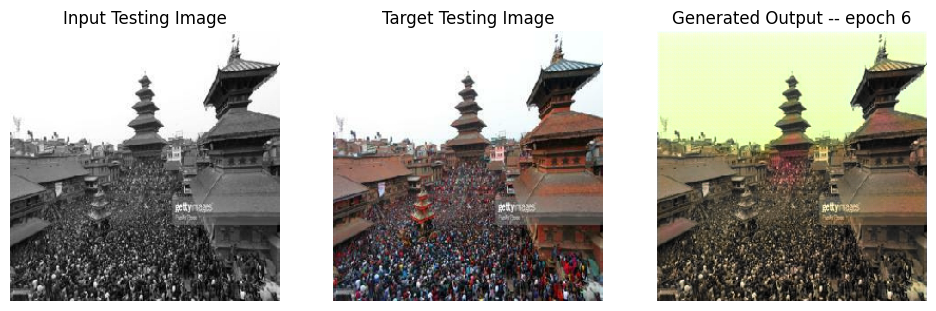

SSIM Score: 0.9252851605415344
PSNR Score: 21.0009708404541


Epoch 7/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 6


Epoch 7/200: 100%|██████████| 245/245 [02:29<00:00,  1.64batches/s]


Training Details
Generator-- total_loss:5.92 gan_loss:1.23 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:1.23 real_loss:0.60 generated_loss:0.63 --- SSIM 0.93 PSNR 23.90
Time taken for epoch 7 is 149.57253646850586 sec
Number of iteration 245



Epoch 7/200: 100%|██████████| 70/70 [02:42<00:00,  2.32s/batches]


Testing Details
Generator-- total_loss:13.56 gan_loss:3.38 l1_loss:0.08 l2_loss:0.01 perceptual_loss:0.00 Discriminator-- total_loss:1.25 real_loss:0.66 generated_loss:0.60 --- SSIM 0.88 PSNR 18.04
Time taken for epoch 7 is 162.29939675331116 sec
Number of iteration 70


Epoch 8/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 7


Epoch 8/200: 100%|██████████| 245/245 [02:29<00:00,  1.64batches/s]


Training Details
Generator-- total_loss:5.79 gan_loss:1.17 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:1.29 real_loss:0.63 generated_loss:0.66 --- SSIM 0.93 PSNR 24.01
Time taken for epoch 8 is 149.7233567237854 sec
Number of iteration 245



Epoch 8/200: 100%|██████████| 70/70 [02:42<00:00,  2.32s/batches]


Testing Details
Generator-- total_loss:6.25 gan_loss:0.93 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:1.31 real_loss:0.54 generated_loss:0.77 --- SSIM 0.94 PSNR 23.60
Time taken for epoch 8 is 162.13482427597046 sec
Number of iteration 70


Epoch 9/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 8


Epoch 9/200: 100%|██████████| 245/245 [02:29<00:00,  1.64batches/s]


Training Details
Generator-- total_loss:6.23 gan_loss:1.56 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:1.28 real_loss:0.64 generated_loss:0.64 --- SSIM 0.93 PSNR 23.89
Time taken for epoch 9 is 149.23313403129578 sec
Number of iteration 245



Epoch 9/200: 100%|██████████| 70/70 [02:41<00:00,  2.31s/batches]


Testing Details
Generator-- total_loss:16.06 gan_loss:0.07 l1_loss:0.12 l2_loss:0.03 perceptual_loss:0.00 Discriminator-- total_loss:8.11 real_loss:6.65 generated_loss:1.45 --- SSIM 0.77 PSNR 14.66
Time taken for epoch 9 is 161.67888736724854 sec
Number of iteration 70


Epoch 10/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 9


Epoch 10/200: 100%|██████████| 245/245 [02:28<00:00,  1.65batches/s]


Training Details
Generator-- total_loss:6.52 gan_loss:1.80 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:1.08 real_loss:0.52 generated_loss:0.56 --- SSIM 0.92 PSNR 23.86
Time taken for epoch 10 is 148.90395140647888 sec
Number of iteration 245



Epoch 10/200: 100%|██████████| 70/70 [02:41<00:00,  2.30s/batches]


Testing Details
Generator-- total_loss:5.78 gan_loss:0.96 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:1.70 real_loss:0.69 generated_loss:1.01 --- SSIM 0.94 PSNR 24.39
Time taken for epoch 10 is 161.30321669578552 sec
Number of iteration 70


Epoch 11/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 10


Epoch 11/200: 100%|██████████| 245/245 [02:29<00:00,  1.64batches/s]


Training Details
Generator-- total_loss:6.01 gan_loss:1.39 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:1.22 real_loss:0.59 generated_loss:0.63 --- SSIM 0.93 PSNR 24.07
Time taken for epoch 11 is 149.62384295463562 sec
Number of iteration 245



Epoch 11/200: 100%|██████████| 70/70 [02:42<00:00,  2.32s/batches]


Testing Details
Generator-- total_loss:6.84 gan_loss:0.51 l1_loss:0.05 l2_loss:0.01 perceptual_loss:0.00 Discriminator-- total_loss:1.37 real_loss:1.09 generated_loss:0.28 --- SSIM 0.91 PSNR 22.36
Time taken for epoch 11 is 162.17384338378906 sec
Number of iteration 70
Displaying one random test image...


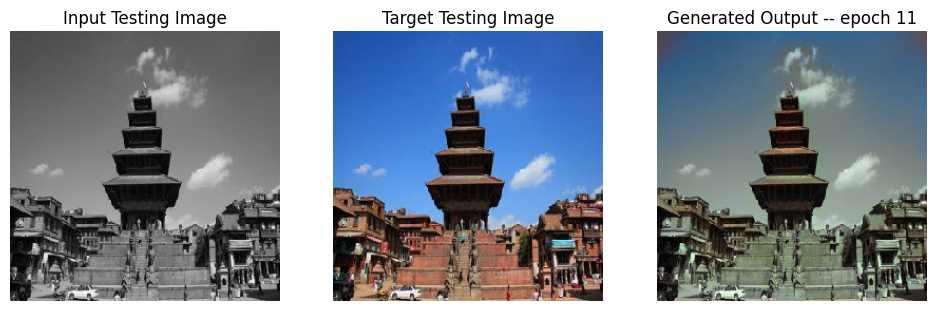

SSIM Score: 0.8464644551277161
PSNR Score: 16.620996475219727


Epoch 12/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 11


Epoch 12/200: 100%|██████████| 245/245 [01:41<00:00,  2.42batches/s]


Training Details
Generator-- total_loss:10.00 gan_loss:5.51 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:0.31 real_loss:0.16 generated_loss:0.15 --- SSIM 0.92 PSNR 24.39
Time taken for epoch 12 is 101.32947516441345 sec
Number of iteration 245



Epoch 12/200: 100%|██████████| 70/70 [01:53<00:00,  1.63s/batches]


Testing Details
Generator-- total_loss:8.30 gan_loss:3.35 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:0.69 real_loss:0.33 generated_loss:0.36 --- SSIM 0.91 PSNR 24.04
Time taken for epoch 12 is 113.76358461380005 sec
Number of iteration 70


Epoch 13/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 12


Epoch 13/200: 100%|██████████| 245/245 [01:41<00:00,  2.42batches/s]


Training Details
Generator-- total_loss:13.48 gan_loss:8.99 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:0.00 real_loss:0.00 generated_loss:0.00 --- SSIM 0.92 PSNR 24.40
Time taken for epoch 13 is 101.22342443466187 sec
Number of iteration 245



Epoch 13/200: 100%|██████████| 70/70 [01:53<00:00,  1.62s/batches]


Testing Details
Generator-- total_loss:9.19 gan_loss:4.16 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:0.63 real_loss:0.26 generated_loss:0.37 --- SSIM 0.91 PSNR 23.90
Time taken for epoch 13 is 113.58585453033447 sec
Number of iteration 70


Epoch 14/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 13


Epoch 14/200: 100%|██████████| 245/245 [01:40<00:00,  2.43batches/s]


Training Details
Generator-- total_loss:14.54 gan_loss:10.05 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:0.00 real_loss:0.00 generated_loss:0.00 --- SSIM 0.92 PSNR 24.38
Time taken for epoch 14 is 100.83282208442688 sec
Number of iteration 245



Epoch 14/200: 100%|██████████| 70/70 [01:53<00:00,  1.62s/batches]


Testing Details
Generator-- total_loss:9.40 gan_loss:4.36 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:0.61 real_loss:0.26 generated_loss:0.36 --- SSIM 0.91 PSNR 23.88
Time taken for epoch 14 is 113.21776390075684 sec
Number of iteration 70


Epoch 15/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 14


Epoch 15/200: 100%|██████████| 245/245 [01:41<00:00,  2.42batches/s]


Training Details
Generator-- total_loss:15.22 gan_loss:10.74 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:0.00 real_loss:0.00 generated_loss:0.00 --- SSIM 0.92 PSNR 24.40
Time taken for epoch 15 is 101.28752160072327 sec
Number of iteration 245



Epoch 15/200: 100%|██████████| 70/70 [01:53<00:00,  1.62s/batches]


Testing Details
Generator-- total_loss:9.48 gan_loss:4.44 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:0.65 real_loss:0.28 generated_loss:0.38 --- SSIM 0.91 PSNR 23.90
Time taken for epoch 15 is 113.68940567970276 sec
Number of iteration 70


Epoch 16/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 15


Epoch 16/200: 100%|██████████| 245/245 [01:40<00:00,  2.43batches/s]


Training Details
Generator-- total_loss:15.83 gan_loss:11.34 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:0.00 real_loss:0.00 generated_loss:0.00 --- SSIM 0.92 PSNR 24.39
Time taken for epoch 16 is 100.93007183074951 sec
Number of iteration 245



Epoch 16/200: 100%|██████████| 70/70 [01:53<00:00,  1.62s/batches]


Testing Details
Generator-- total_loss:9.81 gan_loss:4.77 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:0.66 real_loss:0.23 generated_loss:0.42 --- SSIM 0.91 PSNR 23.89
Time taken for epoch 16 is 113.36228370666504 sec
Number of iteration 70
Displaying one random test image...


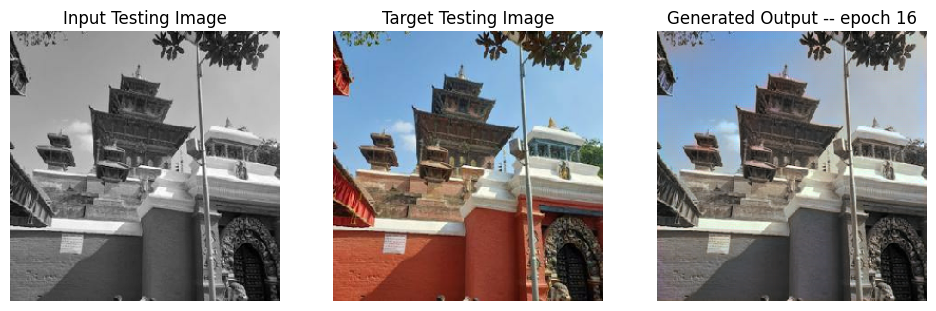

SSIM Score: 0.9055094718933105
PSNR Score: 20.74216079711914
Reduced generator learning rate to 0.0006000000284984708 at epoch 16


Epoch 17/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 16


Epoch 17/200: 100%|██████████| 245/245 [01:37<00:00,  2.52batches/s]


Training Details
Generator-- total_loss:4.15 gan_loss:0.08 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:10.81 real_loss:10.81 generated_loss:0.00 --- SSIM 0.94 PSNR 25.32
Time taken for epoch 17 is 97.37576341629028 sec
Number of iteration 245



Epoch 17/200: 100%|██████████| 70/70 [01:49<00:00,  1.57s/batches]


Testing Details
Generator-- total_loss:5.03 gan_loss:0.00 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:12.00 real_loss:12.00 generated_loss:0.00 --- SSIM 0.95 PSNR 24.23
Time taken for epoch 17 is 109.65833783149719 sec
Number of iteration 70


Epoch 18/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 17


Epoch 18/200: 100%|██████████| 245/245 [01:37<00:00,  2.52batches/s]


Training Details
Generator-- total_loss:3.92 gan_loss:0.00 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:12.37 real_loss:12.37 generated_loss:0.00 --- SSIM 0.95 PSNR 25.64
Time taken for epoch 18 is 97.32642078399658 sec
Number of iteration 245



Epoch 18/200: 100%|██████████| 70/70 [01:49<00:00,  1.57s/batches]


Testing Details
Generator-- total_loss:4.98 gan_loss:0.00 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:15.29 real_loss:15.29 generated_loss:0.00 --- SSIM 0.95 PSNR 24.15
Time taken for epoch 18 is 109.80357813835144 sec
Number of iteration 70


Epoch 19/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 18


Epoch 19/200: 100%|██████████| 245/245 [01:37<00:00,  2.51batches/s]


Training Details
Generator-- total_loss:3.90 gan_loss:0.00 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:12.59 real_loss:12.59 generated_loss:0.00 --- SSIM 0.96 PSNR 25.68
Time taken for epoch 19 is 97.72377896308899 sec
Number of iteration 245



Epoch 19/200: 100%|██████████| 70/70 [01:50<00:00,  1.57s/batches]


Testing Details
Generator-- total_loss:5.08 gan_loss:0.00 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:13.60 real_loss:13.60 generated_loss:0.00 --- SSIM 0.95 PSNR 24.12
Time taken for epoch 19 is 110.10412979125977 sec
Number of iteration 70


Epoch 20/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 19


Epoch 20/200: 100%|██████████| 245/245 [01:38<00:00,  2.49batches/s]


Training Details
Generator-- total_loss:3.89 gan_loss:0.01 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:12.01 real_loss:12.01 generated_loss:0.00 --- SSIM 0.95 PSNR 25.71
Time taken for epoch 20 is 98.20977139472961 sec
Number of iteration 245



Epoch 20/200: 100%|██████████| 70/70 [01:50<00:00,  1.58s/batches]


Testing Details
Generator-- total_loss:6.40 gan_loss:0.00 l1_loss:0.05 l2_loss:0.01 perceptual_loss:0.00 Discriminator-- total_loss:11.30 real_loss:11.30 generated_loss:0.00 --- SSIM 0.93 PSNR 22.00
Time taken for epoch 20 is 110.74451518058777 sec
Number of iteration 70


Epoch 21/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 20


Epoch 21/200: 100%|██████████| 245/245 [01:37<00:00,  2.50batches/s]


Training Details
Generator-- total_loss:3.86 gan_loss:0.00 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:12.83 real_loss:12.83 generated_loss:0.00 --- SSIM 0.96 PSNR 25.78
Time taken for epoch 21 is 97.92724633216858 sec
Number of iteration 245



Epoch 21/200: 100%|██████████| 70/70 [01:50<00:00,  1.58s/batches]


Testing Details
Generator-- total_loss:4.47 gan_loss:0.00 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:13.81 real_loss:13.81 generated_loss:0.00 --- SSIM 0.95 PSNR 25.06
Time taken for epoch 21 is 110.364670753479 sec
Number of iteration 70
Displaying one random test image...


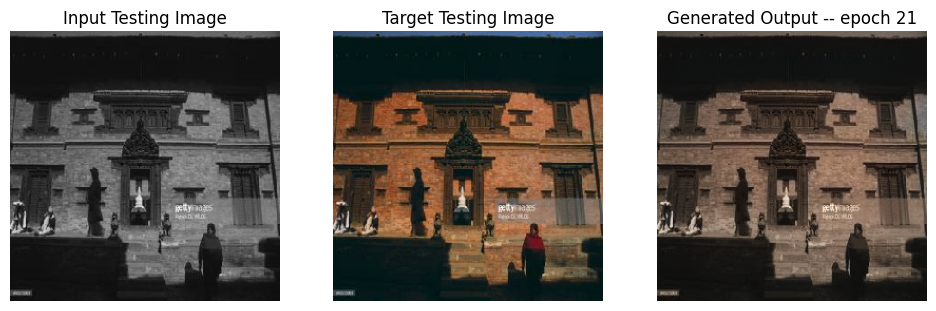

SSIM Score: 0.8937150835990906
PSNR Score: 25.050546646118164


Epoch 22/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 21


Epoch 22/200: 100%|██████████| 245/245 [01:38<00:00,  2.50batches/s]


Training Details
Generator-- total_loss:3.83 gan_loss:0.00 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:12.77 real_loss:12.77 generated_loss:0.00 --- SSIM 0.96 PSNR 25.81
Time taken for epoch 22 is 98.08306670188904 sec
Number of iteration 245



Epoch 22/200: 100%|██████████| 70/70 [01:50<00:00,  1.58s/batches]


Testing Details
Generator-- total_loss:4.46 gan_loss:0.00 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:13.72 real_loss:13.72 generated_loss:0.00 --- SSIM 0.95 PSNR 25.01
Time taken for epoch 22 is 110.53864097595215 sec
Number of iteration 70
Reduced discriminator learning rate to 0.0004000000189989805 at epoch 22.


Epoch 23/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 22


Epoch 23/200: 100%|██████████| 245/245 [01:41<00:00,  2.41batches/s]


Training Details
Generator-- total_loss:9.41 gan_loss:5.61 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:0.21 real_loss:0.12 generated_loss:0.09 --- SSIM 0.96 PSNR 25.89
Time taken for epoch 23 is 101.75300002098083 sec
Number of iteration 245



Epoch 23/200: 100%|██████████| 70/70 [01:54<00:00,  1.63s/batches]


Testing Details
Generator-- total_loss:5.66 gan_loss:1.30 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:1.04 real_loss:0.93 generated_loss:0.10 --- SSIM 0.95 PSNR 25.17
Time taken for epoch 23 is 114.34929203987122 sec
Number of iteration 70


Epoch 24/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 23


Epoch 24/200: 100%|██████████| 245/245 [01:41<00:00,  2.42batches/s]


Training Details
Generator-- total_loss:11.78 gan_loss:7.98 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:0.00 real_loss:0.00 generated_loss:0.00 --- SSIM 0.96 PSNR 25.88
Time taken for epoch 24 is 101.2301983833313 sec
Number of iteration 245



Epoch 24/200: 100%|██████████| 70/70 [01:53<00:00,  1.63s/batches]


Testing Details
Generator-- total_loss:5.93 gan_loss:1.57 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:1.17 real_loss:1.10 generated_loss:0.08 --- SSIM 0.95 PSNR 25.18
Time taken for epoch 24 is 113.91953134536743 sec
Number of iteration 70


Epoch 25/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 24


Epoch 25/200: 100%|██████████| 245/245 [01:41<00:00,  2.41batches/s]


Training Details
Generator-- total_loss:12.79 gan_loss:8.99 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:0.00 real_loss:0.00 generated_loss:0.00 --- SSIM 0.96 PSNR 25.88
Time taken for epoch 25 is 101.68105030059814 sec
Number of iteration 245



Epoch 25/200: 100%|██████████| 70/70 [02:02<00:00,  1.75s/batches]


Testing Details
Generator-- total_loss:6.04 gan_loss:1.68 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:1.26 real_loss:1.18 generated_loss:0.08 --- SSIM 0.95 PSNR 25.18
Time taken for epoch 25 is 122.19984745979309 sec
Number of iteration 70


Epoch 26/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 25


Epoch 26/200: 100%|██████████| 245/245 [01:41<00:00,  2.41batches/s]


Training Details
Generator-- total_loss:13.43 gan_loss:9.62 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:0.00 real_loss:0.00 generated_loss:0.00 --- SSIM 0.96 PSNR 25.87
Time taken for epoch 26 is 101.54298853874207 sec
Number of iteration 245



Epoch 26/200: 100%|██████████| 70/70 [01:54<00:00,  1.63s/batches]


Testing Details
Generator-- total_loss:6.02 gan_loss:1.67 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:1.36 real_loss:1.30 generated_loss:0.06 --- SSIM 0.95 PSNR 25.18
Time taken for epoch 26 is 114.07707333564758 sec
Number of iteration 70
Displaying one random test image...


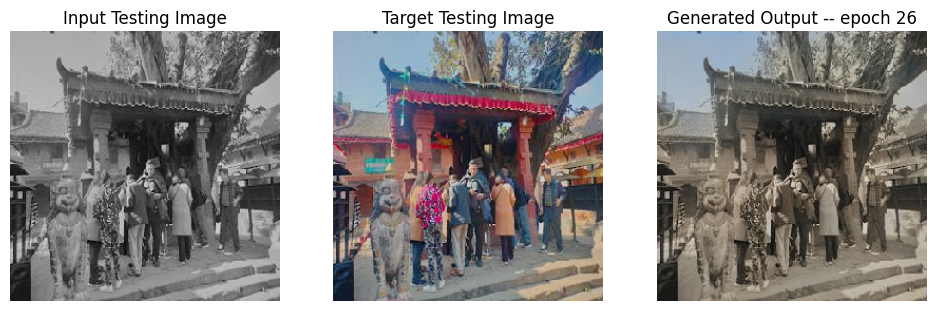

SSIM Score: 0.9312939643859863
PSNR Score: 23.25943946838379
Reduced generator learning rate to 0.0003600000170990825 at epoch 26


Epoch 27/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 26


Epoch 27/200: 100%|██████████| 245/245 [01:38<00:00,  2.50batches/s]


Training Details
Generator-- total_loss:3.87 gan_loss:0.05 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:9.36 real_loss:9.36 generated_loss:0.00 --- SSIM 0.95 PSNR 25.80
Time taken for epoch 27 is 98.1711323261261 sec
Number of iteration 245



Epoch 27/200: 100%|██████████| 70/70 [01:50<00:00,  1.58s/batches]


Testing Details
Generator-- total_loss:4.37 gan_loss:0.00 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:11.20 real_loss:11.20 generated_loss:0.00 --- SSIM 0.95 PSNR 25.15
Time taken for epoch 27 is 110.62479138374329 sec
Number of iteration 70


Epoch 28/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 27


Epoch 28/200: 100%|██████████| 245/245 [01:37<00:00,  2.51batches/s]


Training Details
Generator-- total_loss:3.80 gan_loss:0.00 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:8.76 real_loss:8.76 generated_loss:0.00 --- SSIM 0.96 PSNR 25.88
Time taken for epoch 28 is 97.59693431854248 sec
Number of iteration 245



Epoch 28/200: 100%|██████████| 70/70 [01:50<00:00,  1.57s/batches]


Testing Details
Generator-- total_loss:4.61 gan_loss:0.00 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:11.66 real_loss:11.66 generated_loss:0.00 --- SSIM 0.95 PSNR 24.77
Time taken for epoch 28 is 110.11513090133667 sec
Number of iteration 70


Epoch 29/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 28


Epoch 29/200: 100%|██████████| 245/245 [01:37<00:00,  2.51batches/s]


Training Details
Generator-- total_loss:3.79 gan_loss:0.00 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:8.75 real_loss:8.75 generated_loss:0.00 --- SSIM 0.96 PSNR 25.90
Time taken for epoch 29 is 97.51122570037842 sec
Number of iteration 245



Epoch 29/200: 100%|██████████| 70/70 [01:50<00:00,  1.57s/batches]


Testing Details
Generator-- total_loss:4.54 gan_loss:0.00 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:11.65 real_loss:11.64 generated_loss:0.00 --- SSIM 0.95 PSNR 24.98
Time taken for epoch 29 is 110.02651405334473 sec
Number of iteration 70


Epoch 30/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 29


Epoch 30/200: 100%|██████████| 245/245 [01:37<00:00,  2.51batches/s]


Training Details
Generator-- total_loss:3.77 gan_loss:0.00 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:9.00 real_loss:9.00 generated_loss:0.00 --- SSIM 0.96 PSNR 25.93
Time taken for epoch 30 is 97.52335333824158 sec
Number of iteration 245



Epoch 30/200: 100%|██████████| 70/70 [01:50<00:00,  1.57s/batches]


Testing Details
Generator-- total_loss:4.47 gan_loss:0.00 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:11.76 real_loss:11.76 generated_loss:0.00 --- SSIM 0.95 PSNR 25.04
Time taken for epoch 30 is 110.07176995277405 sec
Number of iteration 70


Epoch 31/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 30


Epoch 31/200: 100%|██████████| 245/245 [01:37<00:00,  2.52batches/s]


Training Details
Generator-- total_loss:3.77 gan_loss:0.00 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:9.24 real_loss:9.24 generated_loss:0.00 --- SSIM 0.96 PSNR 25.93
Time taken for epoch 31 is 97.13754367828369 sec
Number of iteration 245



Epoch 31/200: 100%|██████████| 70/70 [01:49<00:00,  1.56s/batches]


Testing Details
Generator-- total_loss:5.28 gan_loss:0.00 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:12.17 real_loss:12.17 generated_loss:0.00 --- SSIM 0.95 PSNR 23.60
Time taken for epoch 31 is 109.5316309928894 sec
Number of iteration 70
Displaying one random test image...


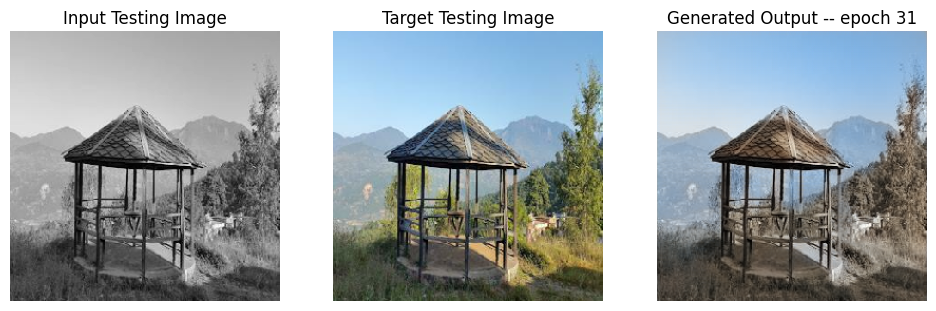

SSIM Score: 0.968978226184845
PSNR Score: 25.506732940673828


Epoch 32/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 31


Epoch 32/200: 100%|██████████| 245/245 [01:37<00:00,  2.51batches/s]


Training Details
Generator-- total_loss:3.75 gan_loss:0.00 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:9.17 real_loss:9.17 generated_loss:0.00 --- SSIM 0.96 PSNR 25.98
Time taken for epoch 32 is 97.63171553611755 sec
Number of iteration 245



Epoch 32/200: 100%|██████████| 70/70 [01:50<00:00,  1.57s/batches]


Testing Details
Generator-- total_loss:4.52 gan_loss:0.00 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:11.95 real_loss:11.95 generated_loss:0.00 --- SSIM 0.95 PSNR 25.00
Time taken for epoch 32 is 110.12588834762573 sec
Number of iteration 70
Reduced discriminator learning rate to 0.00016000000759959222 at epoch 32.


Epoch 33/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 32


Epoch 33/200: 100%|██████████| 245/245 [01:41<00:00,  2.42batches/s]


Training Details
Generator-- total_loss:10.07 gan_loss:6.34 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:0.09 real_loss:0.05 generated_loss:0.04 --- SSIM 0.96 PSNR 26.02
Time taken for epoch 33 is 101.1891233921051 sec
Number of iteration 245



Epoch 33/200: 100%|██████████| 70/70 [01:53<00:00,  1.62s/batches]


Testing Details
Generator-- total_loss:4.46 gan_loss:0.05 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:4.22 real_loss:4.18 generated_loss:0.04 --- SSIM 0.95 PSNR 25.12
Time taken for epoch 33 is 113.63691854476929 sec
Number of iteration 70


Epoch 34/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 33


Epoch 34/200: 100%|██████████| 245/245 [01:41<00:00,  2.42batches/s]


Training Details
Generator-- total_loss:11.58 gan_loss:7.85 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:0.00 real_loss:0.00 generated_loss:0.00 --- SSIM 0.96 PSNR 26.03
Time taken for epoch 34 is 101.29781532287598 sec
Number of iteration 245



Epoch 34/200: 100%|██████████| 70/70 [01:53<00:00,  1.62s/batches]


Testing Details
Generator-- total_loss:4.46 gan_loss:0.04 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:4.69 real_loss:4.65 generated_loss:0.03 --- SSIM 0.95 PSNR 25.09
Time taken for epoch 34 is 113.68251729011536 sec
Number of iteration 70


Epoch 35/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 34


Epoch 35/200: 100%|██████████| 245/245 [01:41<00:00,  2.42batches/s]


Training Details
Generator-- total_loss:12.40 gan_loss:8.67 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:0.00 real_loss:0.00 generated_loss:0.00 --- SSIM 0.96 PSNR 26.01
Time taken for epoch 35 is 101.28060030937195 sec
Number of iteration 245



Epoch 35/200: 100%|██████████| 70/70 [01:53<00:00,  1.63s/batches]


Testing Details
Generator-- total_loss:4.45 gan_loss:0.03 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:5.14 real_loss:5.12 generated_loss:0.02 --- SSIM 0.95 PSNR 25.10
Time taken for epoch 35 is 113.78912043571472 sec
Number of iteration 70


Epoch 36/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 35


Epoch 36/200: 100%|██████████| 245/245 [01:40<00:00,  2.43batches/s]


Training Details
Generator-- total_loss:12.87 gan_loss:9.13 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:0.00 real_loss:0.00 generated_loss:0.00 --- SSIM 0.96 PSNR 26.00
Time taken for epoch 36 is 100.9799416065216 sec
Number of iteration 245



Epoch 36/200: 100%|██████████| 70/70 [01:53<00:00,  1.62s/batches]


Testing Details
Generator-- total_loss:4.44 gan_loss:0.02 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:5.49 real_loss:5.48 generated_loss:0.02 --- SSIM 0.95 PSNR 25.10
Time taken for epoch 36 is 113.32779932022095 sec
Number of iteration 70
Displaying one random test image...


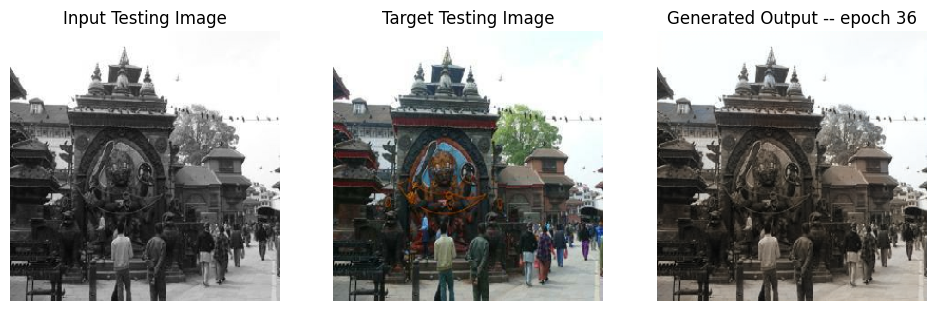

SSIM Score: 0.9733414649963379
PSNR Score: 29.89087677001953
Reduced generator learning rate to 0.00021600000327453016 at epoch 36


Epoch 37/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 36


Epoch 37/200: 100%|██████████| 245/245 [01:37<00:00,  2.50batches/s]


Training Details
Generator-- total_loss:3.88 gan_loss:0.07 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:6.25 real_loss:6.25 generated_loss:0.00 --- SSIM 0.95 PSNR 25.76
Time taken for epoch 37 is 97.81279563903809 sec
Number of iteration 245



Epoch 37/200: 100%|██████████| 70/70 [01:50<00:00,  1.57s/batches]


Testing Details
Generator-- total_loss:4.38 gan_loss:0.00 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:9.77 real_loss:9.75 generated_loss:0.02 --- SSIM 0.95 PSNR 25.13
Time taken for epoch 37 is 110.2351746559143 sec
Number of iteration 70


Epoch 38/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 37


Epoch 38/200: 100%|██████████| 245/245 [01:37<00:00,  2.51batches/s]


Training Details
Generator-- total_loss:3.76 gan_loss:0.01 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:6.45 real_loss:6.44 generated_loss:0.00 --- SSIM 0.95 PSNR 25.90
Time taken for epoch 38 is 97.6609468460083 sec
Number of iteration 245



Epoch 38/200: 100%|██████████| 70/70 [01:49<00:00,  1.57s/batches]


Testing Details
Generator-- total_loss:4.57 gan_loss:0.00 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:9.70 real_loss:9.69 generated_loss:0.02 --- SSIM 0.95 PSNR 24.78
Time taken for epoch 38 is 109.99417090415955 sec
Number of iteration 70


Epoch 39/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 38


Epoch 39/200: 100%|██████████| 245/245 [01:37<00:00,  2.52batches/s]


Training Details
Generator-- total_loss:3.75 gan_loss:0.01 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:6.39 real_loss:6.39 generated_loss:0.00 --- SSIM 0.95 PSNR 25.92
Time taken for epoch 39 is 97.21771001815796 sec
Number of iteration 245



Epoch 39/200: 100%|██████████| 70/70 [01:49<00:00,  1.57s/batches]


Testing Details
Generator-- total_loss:4.38 gan_loss:0.00 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:9.89 real_loss:9.87 generated_loss:0.02 --- SSIM 0.95 PSNR 25.11
Time taken for epoch 39 is 109.7428629398346 sec
Number of iteration 70


Epoch 40/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 39


Epoch 40/200: 100%|██████████| 245/245 [01:37<00:00,  2.52batches/s]


Training Details
Generator-- total_loss:3.74 gan_loss:0.01 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:6.44 real_loss:6.44 generated_loss:0.00 --- SSIM 0.95 PSNR 25.95
Time taken for epoch 40 is 97.2878406047821 sec
Number of iteration 245



Epoch 40/200: 100%|██████████| 70/70 [01:49<00:00,  1.57s/batches]


Testing Details
Generator-- total_loss:4.45 gan_loss:0.00 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:10.07 real_loss:10.06 generated_loss:0.01 --- SSIM 0.95 PSNR 25.04
Time taken for epoch 40 is 109.59839296340942 sec
Number of iteration 70


Epoch 41/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 40


Epoch 41/200: 100%|██████████| 245/245 [01:37<00:00,  2.52batches/s]


Training Details
Generator-- total_loss:3.73 gan_loss:0.01 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:6.48 real_loss:6.48 generated_loss:0.00 --- SSIM 0.95 PSNR 25.95
Time taken for epoch 41 is 97.19160318374634 sec
Number of iteration 245



Epoch 41/200: 100%|██████████| 70/70 [01:49<00:00,  1.57s/batches]


Testing Details
Generator-- total_loss:4.39 gan_loss:0.00 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:9.94 real_loss:9.93 generated_loss:0.01 --- SSIM 0.95 PSNR 25.17
Time taken for epoch 41 is 109.69444704055786 sec
Number of iteration 70
Displaying one random test image...


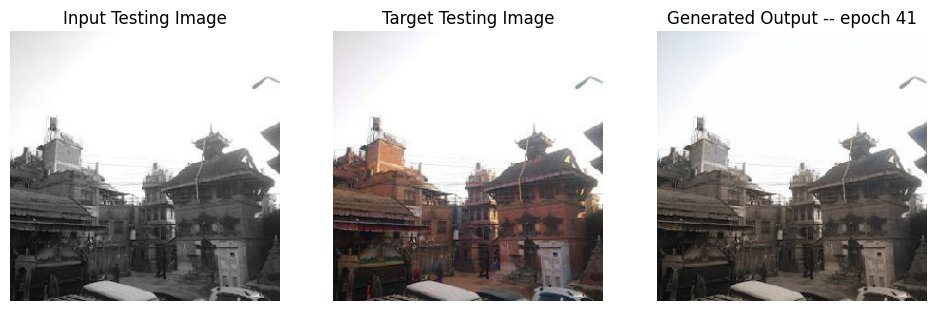

SSIM Score: 0.9857071042060852
PSNR Score: 31.891489028930664


Epoch 42/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 41


Epoch 42/200: 100%|██████████| 245/245 [01:37<00:00,  2.52batches/s]


Training Details
Generator-- total_loss:3.72 gan_loss:0.01 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:6.42 real_loss:6.42 generated_loss:0.00 --- SSIM 0.95 PSNR 25.98
Time taken for epoch 42 is 97.31339812278748 sec
Number of iteration 245



Epoch 42/200: 100%|██████████| 70/70 [01:49<00:00,  1.57s/batches]


Testing Details
Generator-- total_loss:4.39 gan_loss:0.00 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:10.05 real_loss:10.03 generated_loss:0.01 --- SSIM 0.95 PSNR 25.15
Time taken for epoch 42 is 109.6902928352356 sec
Number of iteration 70
Reduced discriminator learning rate to 6.40000042039901e-05 at epoch 42.


Epoch 43/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 42


Epoch 43/200: 100%|██████████| 245/245 [01:40<00:00,  2.43batches/s]


Training Details
Generator-- total_loss:10.70 gan_loss:7.02 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:0.04 real_loss:0.03 generated_loss:0.02 --- SSIM 0.95 PSNR 26.06
Time taken for epoch 43 is 100.88519763946533 sec
Number of iteration 245



Epoch 43/200: 100%|██████████| 70/70 [01:53<00:00,  1.62s/batches]


Testing Details
Generator-- total_loss:4.47 gan_loss:0.13 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:4.40 real_loss:3.92 generated_loss:0.47 --- SSIM 0.95 PSNR 25.21
Time taken for epoch 43 is 113.44305968284607 sec
Number of iteration 70


Epoch 44/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 43


Epoch 44/200: 100%|██████████| 245/245 [01:40<00:00,  2.43batches/s]


Training Details
Generator-- total_loss:12.00 gan_loss:8.32 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:0.00 real_loss:0.00 generated_loss:0.00 --- SSIM 0.96 PSNR 26.06
Time taken for epoch 44 is 100.66465187072754 sec
Number of iteration 245



Epoch 44/200: 100%|██████████| 70/70 [01:53<00:00,  1.62s/batches]


Testing Details
Generator-- total_loss:4.42 gan_loss:0.08 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:4.91 real_loss:4.45 generated_loss:0.46 --- SSIM 0.95 PSNR 25.21
Time taken for epoch 44 is 113.21960759162903 sec
Number of iteration 70


Epoch 45/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 44


Epoch 45/200: 100%|██████████| 245/245 [01:40<00:00,  2.43batches/s]


Training Details
Generator-- total_loss:12.80 gan_loss:9.10 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:0.00 real_loss:0.00 generated_loss:0.00 --- SSIM 0.96 PSNR 26.03
Time taken for epoch 45 is 100.9579689502716 sec
Number of iteration 245



Epoch 45/200: 100%|██████████| 70/70 [01:53<00:00,  1.62s/batches]


Testing Details
Generator-- total_loss:4.38 gan_loss:0.05 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:5.78 real_loss:5.43 generated_loss:0.35 --- SSIM 0.95 PSNR 25.21
Time taken for epoch 45 is 113.37583208084106 sec
Number of iteration 70


Epoch 46/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 45


Epoch 46/200: 100%|██████████| 245/245 [01:40<00:00,  2.43batches/s]


Training Details
Generator-- total_loss:13.38 gan_loss:9.69 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:0.00 real_loss:0.00 generated_loss:0.00 --- SSIM 0.95 PSNR 26.05
Time taken for epoch 46 is 100.84579396247864 sec
Number of iteration 245



Epoch 46/200: 100%|██████████| 70/70 [01:53<00:00,  1.62s/batches]


Testing Details
Generator-- total_loss:4.38 gan_loss:0.04 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:5.64 real_loss:5.28 generated_loss:0.36 --- SSIM 0.95 PSNR 25.20
Time taken for epoch 46 is 113.17085647583008 sec
Number of iteration 70
Displaying one random test image...


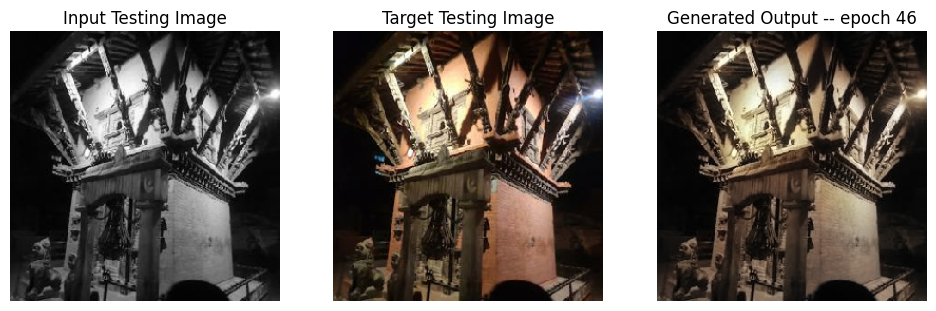

SSIM Score: 0.9707720875740051
PSNR Score: 29.675594329833984
Reduced generator learning rate to 0.00012960000021848827 at epoch 46


Epoch 47/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 46


Epoch 47/200: 100%|██████████| 245/245 [01:37<00:00,  2.52batches/s]


Training Details
Generator-- total_loss:3.81 gan_loss:0.05 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:7.48 real_loss:7.48 generated_loss:0.00 --- SSIM 0.95 PSNR 25.81
Time taken for epoch 47 is 97.16949415206909 sec
Number of iteration 245



Epoch 47/200: 100%|██████████| 70/70 [01:49<00:00,  1.57s/batches]


Testing Details
Generator-- total_loss:4.48 gan_loss:0.00 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:9.66 real_loss:9.66 generated_loss:0.00 --- SSIM 0.94 PSNR 24.95
Time taken for epoch 47 is 109.6845293045044 sec
Number of iteration 70


Epoch 48/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 47


Epoch 48/200: 100%|██████████| 245/245 [01:37<00:00,  2.51batches/s]


Training Details
Generator-- total_loss:3.71 gan_loss:0.01 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:7.38 real_loss:7.38 generated_loss:0.00 --- SSIM 0.95 PSNR 25.97
Time taken for epoch 48 is 97.72347640991211 sec
Number of iteration 245



Epoch 48/200: 100%|██████████| 70/70 [01:50<00:00,  1.58s/batches]


Testing Details
Generator-- total_loss:4.75 gan_loss:0.00 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:9.86 real_loss:9.86 generated_loss:0.00 --- SSIM 0.94 PSNR 24.50
Time taken for epoch 48 is 110.30938959121704 sec
Number of iteration 70


Epoch 49/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 48


Epoch 49/200: 100%|██████████| 245/245 [01:37<00:00,  2.51batches/s]


Training Details
Generator-- total_loss:3.71 gan_loss:0.01 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:7.23 real_loss:7.23 generated_loss:0.00 --- SSIM 0.95 PSNR 26.00
Time taken for epoch 49 is 97.69651412963867 sec
Number of iteration 245



Epoch 49/200: 100%|██████████| 70/70 [01:50<00:00,  1.57s/batches]


Testing Details
Generator-- total_loss:4.38 gan_loss:0.00 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:8.34 real_loss:8.34 generated_loss:0.00 --- SSIM 0.94 PSNR 25.12
Time taken for epoch 49 is 110.17305064201355 sec
Number of iteration 70


Epoch 50/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 49


Epoch 50/200: 100%|██████████| 245/245 [01:37<00:00,  2.52batches/s]


Training Details
Generator-- total_loss:3.71 gan_loss:0.01 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:7.12 real_loss:7.12 generated_loss:0.00 --- SSIM 0.95 PSNR 26.02
Time taken for epoch 50 is 97.36660432815552 sec
Number of iteration 245



Epoch 50/200: 100%|██████████| 70/70 [01:49<00:00,  1.57s/batches]


Testing Details
Generator-- total_loss:4.40 gan_loss:0.00 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:8.95 real_loss:8.95 generated_loss:0.00 --- SSIM 0.95 PSNR 25.10
Time taken for epoch 50 is 109.70751214027405 sec
Number of iteration 70


Epoch 51/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 50


Epoch 51/200: 100%|██████████| 245/245 [01:37<00:00,  2.51batches/s]


Training Details
Generator-- total_loss:3.68 gan_loss:0.01 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:7.00 real_loss:7.00 generated_loss:0.00 --- SSIM 0.95 PSNR 26.07
Time taken for epoch 51 is 97.63646030426025 sec
Number of iteration 245



Epoch 51/200: 100%|██████████| 70/70 [01:50<00:00,  1.57s/batches]


Testing Details
Generator-- total_loss:4.48 gan_loss:0.00 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:9.81 real_loss:9.81 generated_loss:0.00 --- SSIM 0.94 PSNR 24.98
Time taken for epoch 51 is 110.03233551979065 sec
Number of iteration 70
Displaying one random test image...


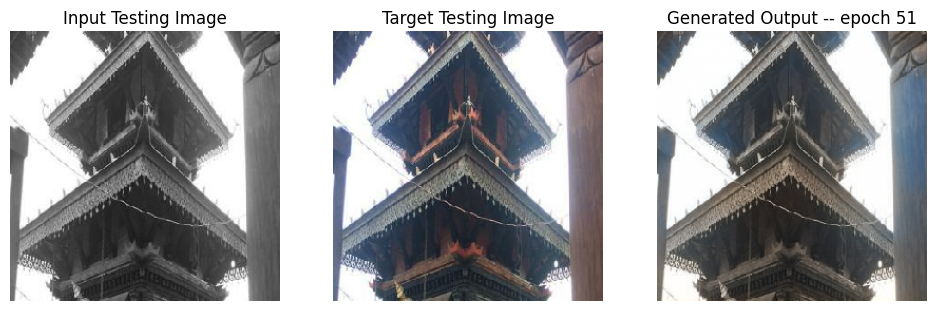

SSIM Score: 0.9736616611480713
PSNR Score: 27.737260818481445


Epoch 52/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 51


Epoch 52/200: 100%|██████████| 245/245 [01:37<00:00,  2.52batches/s]


Training Details
Generator-- total_loss:3.68 gan_loss:0.01 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:6.88 real_loss:6.88 generated_loss:0.00 --- SSIM 0.95 PSNR 26.08
Time taken for epoch 52 is 97.14433240890503 sec
Number of iteration 245



Epoch 52/200: 100%|██████████| 70/70 [01:49<00:00,  1.57s/batches]


Testing Details
Generator-- total_loss:4.65 gan_loss:0.00 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:8.21 real_loss:8.21 generated_loss:0.00 --- SSIM 0.95 PSNR 24.75
Time taken for epoch 52 is 109.68071866035461 sec
Number of iteration 70
Reduced discriminator learning rate to 2.560000284574926e-05 at epoch 52.


Epoch 53/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 52


Epoch 53/200: 100%|██████████| 245/245 [01:41<00:00,  2.41batches/s]


Training Details
Generator-- total_loss:10.25 gan_loss:6.59 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:0.09 real_loss:0.06 generated_loss:0.03 --- SSIM 0.95 PSNR 26.10
Time taken for epoch 53 is 101.46259570121765 sec
Number of iteration 245



Epoch 53/200: 100%|██████████| 70/70 [01:53<00:00,  1.63s/batches]


Testing Details
Generator-- total_loss:4.94 gan_loss:0.55 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:2.20 real_loss:2.11 generated_loss:0.09 --- SSIM 0.94 PSNR 25.08
Time taken for epoch 53 is 113.84137272834778 sec
Number of iteration 70


Epoch 54/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 53


Epoch 54/200: 100%|██████████| 245/245 [01:41<00:00,  2.42batches/s]


Training Details
Generator-- total_loss:11.61 gan_loss:7.95 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:0.01 real_loss:0.00 generated_loss:0.00 --- SSIM 0.95 PSNR 26.09
Time taken for epoch 54 is 101.31435537338257 sec
Number of iteration 245



Epoch 54/200: 100%|██████████| 70/70 [01:53<00:00,  1.63s/batches]


Testing Details
Generator-- total_loss:5.02 gan_loss:0.60 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:2.51 real_loss:2.44 generated_loss:0.06 --- SSIM 0.94 PSNR 25.03
Time taken for epoch 54 is 113.96639323234558 sec
Number of iteration 70
Reduced generator learning rate to 7.775999838486313e-05 at epoch 54


Epoch 55/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 54


Epoch 55/200: 100%|██████████| 245/245 [01:37<00:00,  2.50batches/s]


Training Details
Generator-- total_loss:3.84 gan_loss:0.07 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:6.17 real_loss:6.17 generated_loss:0.00 --- SSIM 0.95 PSNR 25.73
Time taken for epoch 55 is 97.87868762016296 sec
Number of iteration 245



Epoch 55/200: 100%|██████████| 70/70 [01:50<00:00,  1.58s/batches]


Testing Details
Generator-- total_loss:4.48 gan_loss:0.00 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:8.88 real_loss:8.87 generated_loss:0.01 --- SSIM 0.94 PSNR 24.80
Time taken for epoch 55 is 110.41479992866516 sec
Number of iteration 70


Epoch 56/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 55


Epoch 56/200: 100%|██████████| 245/245 [01:38<00:00,  2.49batches/s]


Training Details
Generator-- total_loss:3.73 gan_loss:0.02 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:6.14 real_loss:6.14 generated_loss:0.00 --- SSIM 0.95 PSNR 25.84
Time taken for epoch 56 is 98.45978832244873 sec
Number of iteration 245



Epoch 56/200: 100%|██████████| 70/70 [01:51<00:00,  1.59s/batches]


Testing Details
Generator-- total_loss:4.38 gan_loss:0.00 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:9.26 real_loss:9.26 generated_loss:0.00 --- SSIM 0.94 PSNR 25.03
Time taken for epoch 56 is 111.17753267288208 sec
Number of iteration 70
Displaying one random test image...


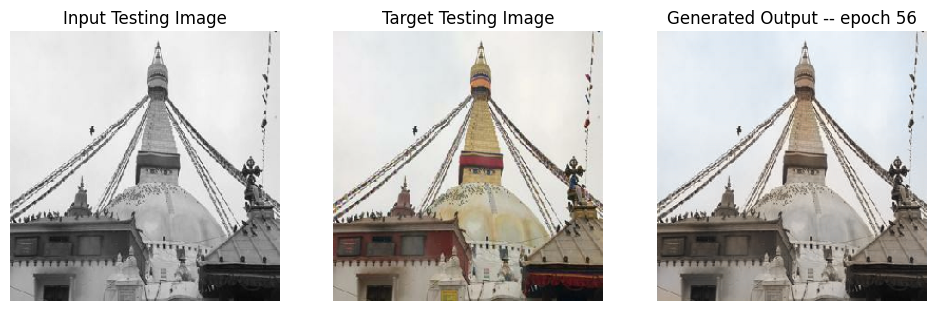

SSIM Score: 0.9788356423377991
PSNR Score: 30.12603759765625


Epoch 57/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 56


Epoch 57/200: 100%|██████████| 245/245 [01:39<00:00,  2.47batches/s]


Training Details
Generator-- total_loss:3.73 gan_loss:0.02 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:6.30 real_loss:6.29 generated_loss:0.00 --- SSIM 0.95 PSNR 25.85
Time taken for epoch 57 is 99.01134514808655 sec
Number of iteration 245



Epoch 57/200: 100%|██████████| 70/70 [01:51<00:00,  1.59s/batches]


Testing Details
Generator-- total_loss:4.86 gan_loss:0.00 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:9.17 real_loss:9.17 generated_loss:0.01 --- SSIM 0.94 PSNR 24.24
Time taken for epoch 57 is 111.60575222969055 sec
Number of iteration 70


Epoch 58/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 57


Epoch 58/200: 100%|██████████| 245/245 [01:38<00:00,  2.49batches/s]


Training Details
Generator-- total_loss:3.71 gan_loss:0.02 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:6.10 real_loss:6.09 generated_loss:0.00 --- SSIM 0.95 PSNR 25.88
Time taken for epoch 58 is 98.4255199432373 sec
Number of iteration 245



Epoch 58/200: 100%|██████████| 70/70 [01:51<00:00,  1.59s/batches]


Testing Details
Generator-- total_loss:4.58 gan_loss:0.00 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:9.19 real_loss:9.19 generated_loss:0.01 --- SSIM 0.94 PSNR 24.68
Time taken for epoch 58 is 111.24262189865112 sec
Number of iteration 70


Epoch 59/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 58


Epoch 59/200: 100%|██████████| 245/245 [01:38<00:00,  2.49batches/s]


Training Details
Generator-- total_loss:3.70 gan_loss:0.02 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:5.89 real_loss:5.89 generated_loss:0.00 --- SSIM 0.95 PSNR 25.92
Time taken for epoch 59 is 98.22734379768372 sec
Number of iteration 245



Epoch 59/200: 100%|██████████| 70/70 [01:50<00:00,  1.59s/batches]


Testing Details
Generator-- total_loss:4.41 gan_loss:0.00 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:9.02 real_loss:9.01 generated_loss:0.01 --- SSIM 0.95 PSNR 25.00
Time taken for epoch 59 is 111.0051703453064 sec
Number of iteration 70


Epoch 60/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 59


Epoch 60/200: 100%|██████████| 245/245 [01:38<00:00,  2.49batches/s]


Training Details
Generator-- total_loss:3.71 gan_loss:0.02 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:6.09 real_loss:6.09 generated_loss:0.01 --- SSIM 0.95 PSNR 25.88
Time taken for epoch 60 is 98.4837293624878 sec
Number of iteration 245



Epoch 60/200: 100%|██████████| 70/70 [01:51<00:00,  1.59s/batches]


Testing Details
Generator-- total_loss:4.34 gan_loss:0.00 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:8.92 real_loss:8.91 generated_loss:0.01 --- SSIM 0.95 PSNR 25.17
Time taken for epoch 60 is 111.0722861289978 sec
Number of iteration 70
Reduced discriminator learning rate to 1.0240000847261399e-05 at epoch 60.


Epoch 61/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 60


Epoch 61/200: 100%|██████████| 245/245 [01:42<00:00,  2.38batches/s]


Training Details
Generator-- total_loss:8.33 gan_loss:4.68 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:0.18 real_loss:0.09 generated_loss:0.10 --- SSIM 0.95 PSNR 25.96
Time taken for epoch 61 is 102.81122016906738 sec
Number of iteration 245



Epoch 61/200: 100%|██████████| 70/70 [01:55<00:00,  1.65s/batches]


Testing Details
Generator-- total_loss:4.45 gan_loss:0.09 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:3.46 real_loss:3.27 generated_loss:0.19 --- SSIM 0.95 PSNR 25.08
Time taken for epoch 61 is 115.46055126190186 sec
Number of iteration 70
Displaying one random test image...


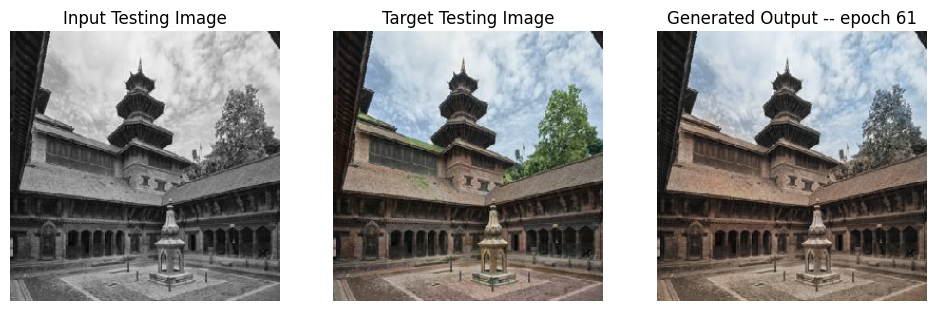

SSIM Score: 0.9856669902801514
PSNR Score: 32.43999481201172


Epoch 62/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 61


Epoch 62/200: 100%|██████████| 245/245 [01:42<00:00,  2.40batches/s]


Training Details
Generator-- total_loss:9.81 gan_loss:6.14 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:0.03 real_loss:0.01 generated_loss:0.02 --- SSIM 0.95 PSNR 25.94
Time taken for epoch 62 is 102.25221514701843 sec
Number of iteration 245



Epoch 62/200: 100%|██████████| 70/70 [01:54<00:00,  1.64s/batches]


Testing Details
Generator-- total_loss:4.46 gan_loss:0.10 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:3.67 real_loss:3.49 generated_loss:0.18 --- SSIM 0.95 PSNR 25.05
Time taken for epoch 62 is 114.85430264472961 sec
Number of iteration 70


Epoch 63/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 62


Epoch 63/200: 100%|██████████| 245/245 [01:42<00:00,  2.40batches/s]


Training Details
Generator-- total_loss:10.57 gan_loss:6.90 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:0.02 real_loss:0.01 generated_loss:0.01 --- SSIM 0.95 PSNR 25.93
Time taken for epoch 63 is 102.24694037437439 sec
Number of iteration 245



Epoch 63/200: 100%|██████████| 70/70 [01:55<00:00,  1.64s/batches]


Testing Details
Generator-- total_loss:4.46 gan_loss:0.11 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:4.09 real_loss:3.92 generated_loss:0.17 --- SSIM 0.95 PSNR 25.06
Time taken for epoch 63 is 115.09409642219543 sec
Number of iteration 70


Epoch 64/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 63


Epoch 64/200: 100%|██████████| 245/245 [01:42<00:00,  2.39batches/s]


Training Details
Generator-- total_loss:10.81 gan_loss:7.15 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:0.01 real_loss:0.01 generated_loss:0.01 --- SSIM 0.95 PSNR 25.95
Time taken for epoch 64 is 102.49714732170105 sec
Number of iteration 245



Epoch 64/200: 100%|██████████| 70/70 [01:54<00:00,  1.64s/batches]


Testing Details
Generator-- total_loss:4.47 gan_loss:0.11 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:4.37 real_loss:4.22 generated_loss:0.15 --- SSIM 0.95 PSNR 25.05
Time taken for epoch 64 is 115.00236225128174 sec
Number of iteration 70


Epoch 65/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 64


Epoch 65/200: 100%|██████████| 245/245 [01:42<00:00,  2.39batches/s]


Training Details
Generator-- total_loss:11.41 gan_loss:7.73 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:0.01 real_loss:0.00 generated_loss:0.00 --- SSIM 0.95 PSNR 25.92
Time taken for epoch 65 is 102.54138731956482 sec
Number of iteration 245



Epoch 65/200: 100%|██████████| 70/70 [01:55<00:00,  1.65s/batches]


Testing Details
Generator-- total_loss:4.49 gan_loss:0.13 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:4.07 real_loss:3.92 generated_loss:0.15 --- SSIM 0.95 PSNR 25.06
Time taken for epoch 65 is 115.3437020778656 sec
Number of iteration 70
Reduced generator learning rate to 4.6655999904032795e-05 at epoch 65


Epoch 66/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 65


Epoch 66/200: 100%|██████████| 245/245 [01:38<00:00,  2.49batches/s]


Training Details
Generator-- total_loss:3.81 gan_loss:0.06 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:5.90 real_loss:5.90 generated_loss:0.01 --- SSIM 0.95 PSNR 25.71
Time taken for epoch 66 is 98.41145944595337 sec
Number of iteration 245



Epoch 66/200: 100%|██████████| 70/70 [01:50<00:00,  1.58s/batches]


Testing Details
Generator-- total_loss:4.50 gan_loss:0.00 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:7.91 real_loss:7.91 generated_loss:0.00 --- SSIM 0.94 PSNR 24.80
Time taken for epoch 66 is 110.88079905509949 sec
Number of iteration 70
Displaying one random test image...


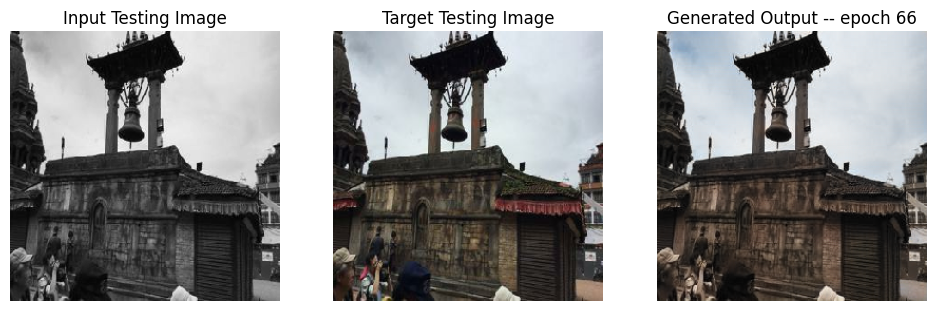

SSIM Score: 0.9853354096412659
PSNR Score: 35.073692321777344


Epoch 67/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 66


Epoch 67/200: 100%|██████████| 245/245 [01:38<00:00,  2.49batches/s]


Training Details
Generator-- total_loss:3.73 gan_loss:0.02 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:5.96 real_loss:5.95 generated_loss:0.01 --- SSIM 0.95 PSNR 25.84
Time taken for epoch 67 is 98.47580170631409 sec
Number of iteration 245



Epoch 67/200: 100%|██████████| 70/70 [01:50<00:00,  1.58s/batches]


Testing Details
Generator-- total_loss:4.39 gan_loss:0.01 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:7.21 real_loss:7.21 generated_loss:0.00 --- SSIM 0.94 PSNR 25.03
Time taken for epoch 67 is 110.88513588905334 sec
Number of iteration 70


Epoch 68/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 67


Epoch 68/200: 100%|██████████| 245/245 [01:37<00:00,  2.50batches/s]


Training Details
Generator-- total_loss:3.71 gan_loss:0.02 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:5.98 real_loss:5.97 generated_loss:0.01 --- SSIM 0.95 PSNR 25.89
Time taken for epoch 68 is 97.99773740768433 sec
Number of iteration 245



Epoch 68/200: 100%|██████████| 70/70 [01:50<00:00,  1.58s/batches]


Testing Details
Generator-- total_loss:4.53 gan_loss:0.01 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:7.34 real_loss:7.34 generated_loss:0.00 --- SSIM 0.94 PSNR 24.79
Time taken for epoch 68 is 110.77464938163757 sec
Number of iteration 70


Epoch 69/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 68


Epoch 69/200: 100%|██████████| 245/245 [01:38<00:00,  2.48batches/s]


Training Details
Generator-- total_loss:3.72 gan_loss:0.02 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:6.03 real_loss:6.02 generated_loss:0.00 --- SSIM 0.95 PSNR 25.90
Time taken for epoch 69 is 98.67685604095459 sec
Number of iteration 245



Epoch 69/200: 100%|██████████| 70/70 [01:51<00:00,  1.59s/batches]


Testing Details
Generator-- total_loss:4.44 gan_loss:0.01 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:7.09 real_loss:7.09 generated_loss:0.00 --- SSIM 0.94 PSNR 24.94
Time taken for epoch 69 is 111.49627590179443 sec
Number of iteration 70


Epoch 70/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 69


Epoch 70/200: 100%|██████████| 245/245 [01:39<00:00,  2.47batches/s]


Training Details
Generator-- total_loss:3.70 gan_loss:0.02 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:5.96 real_loss:5.96 generated_loss:0.00 --- SSIM 0.95 PSNR 25.93
Time taken for epoch 70 is 99.2090630531311 sec
Number of iteration 245



Epoch 70/200: 100%|██████████| 70/70 [01:51<00:00,  1.60s/batches]


Testing Details
Generator-- total_loss:4.36 gan_loss:0.01 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:6.77 real_loss:6.77 generated_loss:0.00 --- SSIM 0.94 PSNR 25.14
Time taken for epoch 70 is 111.85144567489624 sec
Number of iteration 70


Epoch 71/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 70


Epoch 71/200: 100%|██████████| 245/245 [01:38<00:00,  2.49batches/s]


Training Details
Generator-- total_loss:3.70 gan_loss:0.02 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:6.03 real_loss:6.03 generated_loss:0.01 --- SSIM 0.95 PSNR 25.94
Time taken for epoch 71 is 98.42765045166016 sec
Number of iteration 245



Epoch 71/200: 100%|██████████| 70/70 [01:51<00:00,  1.59s/batches]


Testing Details
Generator-- total_loss:4.49 gan_loss:0.01 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:7.12 real_loss:7.12 generated_loss:0.00 --- SSIM 0.93 PSNR 24.87
Time taken for epoch 71 is 111.17466163635254 sec
Number of iteration 70
Displaying one random test image...


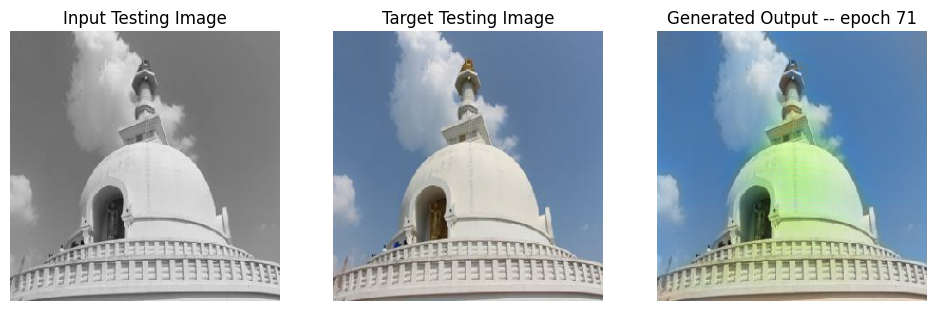

SSIM Score: 0.8875787258148193
PSNR Score: 24.289379119873047
Reduced discriminator learning rate to 4.09600033890456e-06 at epoch 71.


Epoch 72/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 71


Epoch 72/200: 100%|██████████| 245/245 [01:42<00:00,  2.39batches/s]


Training Details
Generator-- total_loss:7.42 gan_loss:3.75 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:0.42 real_loss:0.24 generated_loss:0.18 --- SSIM 0.95 PSNR 25.99
Time taken for epoch 72 is 102.49178338050842 sec
Number of iteration 245



Epoch 72/200: 100%|██████████| 70/70 [01:54<00:00,  1.64s/batches]


Testing Details
Generator-- total_loss:5.71 gan_loss:1.30 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:1.25 real_loss:1.16 generated_loss:0.09 --- SSIM 0.93 PSNR 25.00
Time taken for epoch 72 is 114.98332977294922 sec
Number of iteration 70


Epoch 73/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 72


Epoch 73/200: 100%|██████████| 245/245 [01:42<00:00,  2.40batches/s]


Training Details
Generator-- total_loss:8.87 gan_loss:5.21 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:0.09 real_loss:0.04 generated_loss:0.05 --- SSIM 0.95 PSNR 26.00
Time taken for epoch 73 is 102.1584837436676 sec
Number of iteration 245



Epoch 73/200: 100%|██████████| 70/70 [02:02<00:00,  1.75s/batches]


Testing Details
Generator-- total_loss:5.72 gan_loss:1.30 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:1.32 real_loss:1.26 generated_loss:0.06 --- SSIM 0.93 PSNR 24.99
Time taken for epoch 73 is 122.6776659488678 sec
Number of iteration 70


Epoch 74/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 73


Epoch 74/200: 100%|██████████| 245/245 [01:42<00:00,  2.40batches/s]


Training Details
Generator-- total_loss:9.28 gan_loss:5.61 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:0.07 real_loss:0.03 generated_loss:0.04 --- SSIM 0.95 PSNR 25.98
Time taken for epoch 74 is 102.02678871154785 sec
Number of iteration 245



Epoch 74/200: 100%|██████████| 70/70 [01:54<00:00,  1.64s/batches]


Testing Details
Generator-- total_loss:5.69 gan_loss:1.27 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:1.55 real_loss:1.51 generated_loss:0.04 --- SSIM 0.93 PSNR 24.99
Time taken for epoch 74 is 114.64242458343506 sec
Number of iteration 70


Epoch 75/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 74


Epoch 75/200: 100%|██████████| 245/245 [01:42<00:00,  2.39batches/s]


Training Details
Generator-- total_loss:9.87 gan_loss:6.21 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:0.04 real_loss:0.02 generated_loss:0.02 --- SSIM 0.95 PSNR 25.98
Time taken for epoch 75 is 102.60670590400696 sec
Number of iteration 245



Epoch 75/200: 100%|██████████| 70/70 [01:55<00:00,  1.65s/batches]


Testing Details
Generator-- total_loss:5.82 gan_loss:1.40 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:1.38 real_loss:1.33 generated_loss:0.05 --- SSIM 0.93 PSNR 24.99
Time taken for epoch 75 is 115.35710644721985 sec
Number of iteration 70


Epoch 76/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 75


Epoch 76/200: 100%|██████████| 245/245 [01:41<00:00,  2.40batches/s]


Training Details
Generator-- total_loss:10.27 gan_loss:6.60 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:0.03 real_loss:0.01 generated_loss:0.01 --- SSIM 0.95 PSNR 25.97
Time taken for epoch 76 is 101.91989421844482 sec
Number of iteration 245



Epoch 76/200: 100%|██████████| 70/70 [01:54<00:00,  1.63s/batches]


Testing Details
Generator-- total_loss:5.79 gan_loss:1.39 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:1.47 real_loss:1.43 generated_loss:0.04 --- SSIM 0.93 PSNR 25.01
Time taken for epoch 76 is 114.4408688545227 sec
Number of iteration 70
Displaying one random test image...


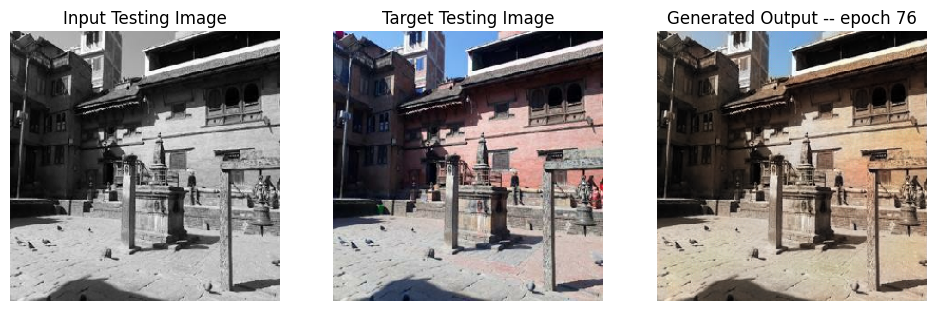

SSIM Score: 0.9669902324676514
PSNR Score: 26.119060516357422
Reduced generator learning rate to 2.799360081553459e-05 at epoch 76


Epoch 77/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 76


Epoch 77/200: 100%|██████████| 245/245 [01:38<00:00,  2.48batches/s]


Training Details
Generator-- total_loss:3.90 gan_loss:0.08 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:5.49 real_loss:5.48 generated_loss:0.01 --- SSIM 0.94 PSNR 25.61
Time taken for epoch 77 is 98.7800145149231 sec
Number of iteration 245



Epoch 77/200: 100%|██████████| 70/70 [01:51<00:00,  1.59s/batches]


Testing Details
Generator-- total_loss:4.58 gan_loss:0.00 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:7.09 real_loss:7.08 generated_loss:0.01 --- SSIM 0.94 PSNR 24.73
Time taken for epoch 77 is 111.43603134155273 sec
Number of iteration 70


Epoch 78/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 77


Epoch 78/200: 100%|██████████| 245/245 [01:38<00:00,  2.48batches/s]


Training Details
Generator-- total_loss:3.81 gan_loss:0.03 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:5.68 real_loss:5.67 generated_loss:0.01 --- SSIM 0.95 PSNR 25.69
Time taken for epoch 78 is 98.95227980613708 sec
Number of iteration 245



Epoch 78/200: 100%|██████████| 70/70 [01:52<00:00,  1.60s/batches]


Testing Details
Generator-- total_loss:4.56 gan_loss:0.00 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:7.91 real_loss:7.91 generated_loss:0.01 --- SSIM 0.94 PSNR 24.71
Time taken for epoch 78 is 112.01124215126038 sec
Number of iteration 70


Epoch 79/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 78


Epoch 79/200: 100%|██████████| 245/245 [01:38<00:00,  2.49batches/s]


Training Details
Generator-- total_loss:3.80 gan_loss:0.03 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:5.44 real_loss:5.43 generated_loss:0.01 --- SSIM 0.95 PSNR 25.74
Time taken for epoch 79 is 98.58646512031555 sec
Number of iteration 245



Epoch 79/200: 100%|██████████| 70/70 [01:51<00:00,  1.59s/batches]


Testing Details
Generator-- total_loss:4.45 gan_loss:0.00 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:7.78 real_loss:7.77 generated_loss:0.01 --- SSIM 0.94 PSNR 24.92
Time taken for epoch 79 is 111.12100076675415 sec
Number of iteration 70


Epoch 80/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 79


Epoch 80/200: 100%|██████████| 245/245 [01:38<00:00,  2.49batches/s]


Training Details
Generator-- total_loss:3.77 gan_loss:0.03 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:5.51 real_loss:5.50 generated_loss:0.01 --- SSIM 0.95 PSNR 25.77
Time taken for epoch 80 is 98.52827882766724 sec
Number of iteration 245



Epoch 80/200: 100%|██████████| 70/70 [01:51<00:00,  1.59s/batches]


Testing Details
Generator-- total_loss:4.46 gan_loss:0.00 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:8.55 real_loss:8.54 generated_loss:0.01 --- SSIM 0.94 PSNR 24.90
Time taken for epoch 80 is 111.18962001800537 sec
Number of iteration 70


Epoch 81/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 80


Epoch 81/200: 100%|██████████| 245/245 [01:38<00:00,  2.48batches/s]


Training Details
Generator-- total_loss:3.76 gan_loss:0.03 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:5.46 real_loss:5.46 generated_loss:0.01 --- SSIM 0.95 PSNR 25.80
Time taken for epoch 81 is 98.81075072288513 sec
Number of iteration 245



Epoch 81/200: 100%|██████████| 70/70 [01:51<00:00,  1.59s/batches]


Testing Details
Generator-- total_loss:4.58 gan_loss:0.00 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:8.27 real_loss:8.25 generated_loss:0.01 --- SSIM 0.94 PSNR 24.70
Time taken for epoch 81 is 111.55467104911804 sec
Number of iteration 70
Displaying one random test image...


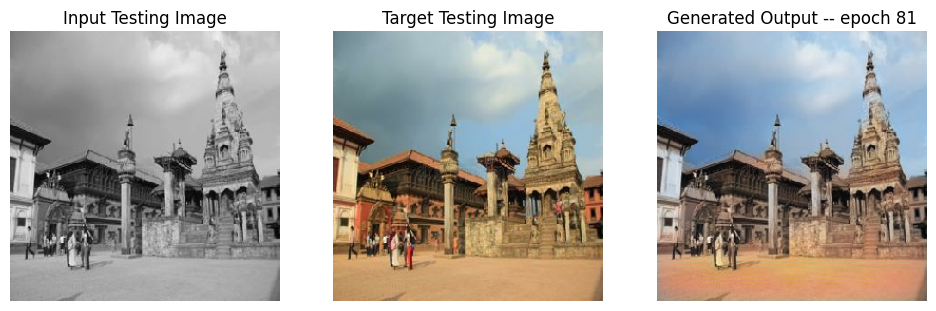

SSIM Score: 0.9131653904914856
PSNR Score: 23.922828674316406


Epoch 82/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 81


Epoch 82/200: 100%|██████████| 245/245 [01:38<00:00,  2.48batches/s]


Training Details
Generator-- total_loss:3.75 gan_loss:0.03 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:5.57 real_loss:5.56 generated_loss:0.01 --- SSIM 0.95 PSNR 25.82
Time taken for epoch 82 is 98.72000789642334 sec
Number of iteration 245



Epoch 82/200: 100%|██████████| 70/70 [01:51<00:00,  1.59s/batches]


Testing Details
Generator-- total_loss:4.51 gan_loss:0.00 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:8.36 real_loss:8.35 generated_loss:0.01 --- SSIM 0.94 PSNR 24.86
Time taken for epoch 82 is 111.2405858039856 sec
Number of iteration 70
Reduced discriminator learning rate to 1.6384001355618238e-06 at epoch 82.


Epoch 83/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 82


Epoch 83/200: 100%|██████████| 245/245 [01:42<00:00,  2.39batches/s]


Training Details
Generator-- total_loss:6.46 gan_loss:2.75 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:0.68 real_loss:0.42 generated_loss:0.26 --- SSIM 0.94 PSNR 25.85
Time taken for epoch 83 is 102.38347029685974 sec
Number of iteration 245



Epoch 83/200: 100%|██████████| 70/70 [01:55<00:00,  1.65s/batches]


Testing Details
Generator-- total_loss:4.70 gan_loss:0.23 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:3.11 real_loss:2.60 generated_loss:0.51 --- SSIM 0.94 PSNR 24.88
Time taken for epoch 83 is 115.1692247390747 sec
Number of iteration 70


Epoch 84/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 83


Epoch 84/200: 100%|██████████| 245/245 [01:42<00:00,  2.39batches/s]


Training Details
Generator-- total_loss:7.38 gan_loss:3.67 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:0.27 real_loss:0.10 generated_loss:0.18 --- SSIM 0.94 PSNR 25.85
Time taken for epoch 84 is 102.65066814422607 sec
Number of iteration 245



Epoch 84/200: 100%|██████████| 70/70 [01:55<00:00,  1.65s/batches]


Testing Details
Generator-- total_loss:4.78 gan_loss:0.31 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:2.74 real_loss:2.21 generated_loss:0.54 --- SSIM 0.94 PSNR 24.89
Time taken for epoch 84 is 115.52935123443604 sec
Number of iteration 70


Epoch 85/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 84


Epoch 85/200: 100%|██████████| 245/245 [01:42<00:00,  2.39batches/s]


Training Details
Generator-- total_loss:7.49 gan_loss:3.78 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:0.24 real_loss:0.08 generated_loss:0.15 --- SSIM 0.94 PSNR 25.86
Time taken for epoch 85 is 102.72084331512451 sec
Number of iteration 245



Epoch 85/200: 100%|██████████| 70/70 [01:55<00:00,  1.65s/batches]


Testing Details
Generator-- total_loss:4.67 gan_loss:0.21 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:2.95 real_loss:2.58 generated_loss:0.37 --- SSIM 0.94 PSNR 24.90
Time taken for epoch 85 is 115.35235929489136 sec
Number of iteration 70


Epoch 86/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 85


Epoch 86/200: 100%|██████████| 245/245 [01:42<00:00,  2.38batches/s]


Training Details
Generator-- total_loss:7.75 gan_loss:4.04 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:0.17 real_loss:0.07 generated_loss:0.10 --- SSIM 0.94 PSNR 25.84
Time taken for epoch 86 is 102.89512705802917 sec
Number of iteration 245



Epoch 86/200: 100%|██████████| 70/70 [01:55<00:00,  1.66s/batches]


Testing Details
Generator-- total_loss:4.74 gan_loss:0.28 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:2.74 real_loss:2.33 generated_loss:0.41 --- SSIM 0.94 PSNR 24.89
Time taken for epoch 86 is 115.89217853546143 sec
Number of iteration 70
Displaying one random test image...


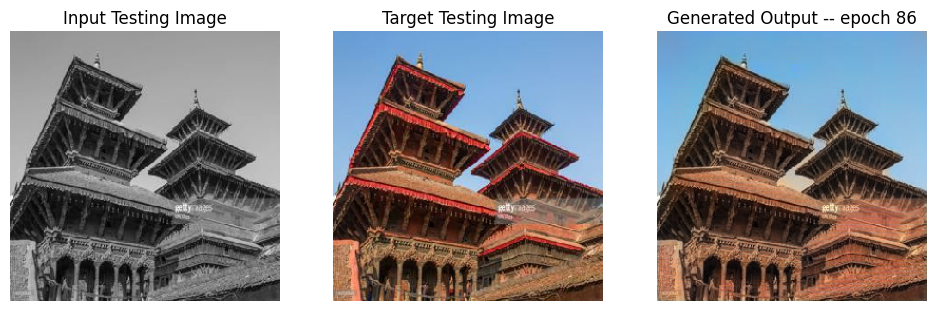

SSIM Score: 0.9174733757972717
PSNR Score: 26.023204803466797


Epoch 87/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 86


Epoch 87/200: 100%|██████████| 245/245 [01:43<00:00,  2.37batches/s]


Training Details
Generator-- total_loss:7.98 gan_loss:4.26 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:0.17 real_loss:0.06 generated_loss:0.11 --- SSIM 0.94 PSNR 25.85
Time taken for epoch 87 is 103.3490104675293 sec
Number of iteration 245



Epoch 87/200: 100%|██████████| 70/70 [01:55<00:00,  1.66s/batches]


Testing Details
Generator-- total_loss:4.70 gan_loss:0.23 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:2.87 real_loss:2.53 generated_loss:0.34 --- SSIM 0.94 PSNR 24.89
Time taken for epoch 87 is 115.97196698188782 sec
Number of iteration 70
Reduced generator learning rate to 1.6796160707599483e-05 at epoch 87


Epoch 88/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 87


Epoch 88/200: 100%|██████████| 245/245 [01:38<00:00,  2.48batches/s]


Training Details
Generator-- total_loss:3.95 gan_loss:0.08 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:4.61 real_loss:4.49 generated_loss:0.12 --- SSIM 0.94 PSNR 25.49
Time taken for epoch 88 is 98.62741923332214 sec
Number of iteration 245



Epoch 88/200: 100%|██████████| 70/70 [01:51<00:00,  1.59s/batches]


Testing Details
Generator-- total_loss:4.69 gan_loss:0.01 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:5.64 real_loss:5.61 generated_loss:0.02 --- SSIM 0.93 PSNR 24.46
Time taken for epoch 88 is 111.22089767456055 sec
Number of iteration 70


Epoch 89/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 88


Epoch 89/200: 100%|██████████| 245/245 [01:38<00:00,  2.49batches/s]


Training Details
Generator-- total_loss:3.89 gan_loss:0.04 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:4.71 real_loss:4.63 generated_loss:0.09 --- SSIM 0.94 PSNR 25.51
Time taken for epoch 89 is 98.30373859405518 sec
Number of iteration 245



Epoch 89/200: 100%|██████████| 70/70 [01:51<00:00,  1.59s/batches]


Testing Details
Generator-- total_loss:4.63 gan_loss:0.01 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:5.89 real_loss:5.87 generated_loss:0.02 --- SSIM 0.93 PSNR 24.58
Time taken for epoch 89 is 111.07431602478027 sec
Number of iteration 70


Epoch 90/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 89


Epoch 90/200: 100%|██████████| 245/245 [01:38<00:00,  2.48batches/s]


Training Details
Generator-- total_loss:3.89 gan_loss:0.04 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:4.77 real_loss:4.67 generated_loss:0.10 --- SSIM 0.94 PSNR 25.51
Time taken for epoch 90 is 98.6587541103363 sec
Number of iteration 245



Epoch 90/200: 100%|██████████| 70/70 [01:51<00:00,  1.59s/batches]


Testing Details
Generator-- total_loss:4.64 gan_loss:0.01 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:5.74 real_loss:5.72 generated_loss:0.02 --- SSIM 0.94 PSNR 24.58
Time taken for epoch 90 is 111.57164478302002 sec
Number of iteration 70


Epoch 91/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 90


Epoch 91/200: 100%|██████████| 245/245 [01:38<00:00,  2.48batches/s]


Training Details
Generator-- total_loss:3.86 gan_loss:0.04 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:4.68 real_loss:4.58 generated_loss:0.10 --- SSIM 0.94 PSNR 25.55
Time taken for epoch 91 is 98.6479561328888 sec
Number of iteration 245



Epoch 91/200: 100%|██████████| 70/70 [01:51<00:00,  1.59s/batches]


Testing Details
Generator-- total_loss:4.70 gan_loss:0.01 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:5.83 real_loss:5.81 generated_loss:0.02 --- SSIM 0.93 PSNR 24.43
Time taken for epoch 91 is 111.13587784767151 sec
Number of iteration 70
Displaying one random test image...


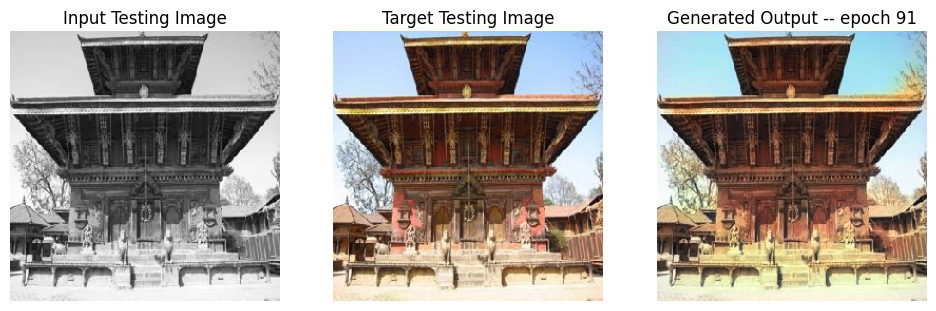

SSIM Score: 0.9429716467857361
PSNR Score: 26.014394760131836


Epoch 92/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 91


Epoch 92/200: 100%|██████████| 245/245 [01:38<00:00,  2.49batches/s]


Training Details
Generator-- total_loss:3.87 gan_loss:0.04 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:4.64 real_loss:4.56 generated_loss:0.08 --- SSIM 0.94 PSNR 25.54
Time taken for epoch 92 is 98.51206588745117 sec
Number of iteration 245



Epoch 92/200: 100%|██████████| 70/70 [01:51<00:00,  1.59s/batches]


Testing Details
Generator-- total_loss:4.67 gan_loss:0.01 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:5.79 real_loss:5.77 generated_loss:0.02 --- SSIM 0.93 PSNR 24.42
Time taken for epoch 92 is 111.12674236297607 sec
Number of iteration 70


Epoch 93/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 92


Epoch 93/200: 100%|██████████| 245/245 [01:39<00:00,  2.47batches/s]


Training Details
Generator-- total_loss:3.86 gan_loss:0.03 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:4.61 real_loss:4.55 generated_loss:0.06 --- SSIM 0.94 PSNR 25.54
Time taken for epoch 93 is 99.34006905555725 sec
Number of iteration 245



Epoch 93/200: 100%|██████████| 70/70 [01:52<00:00,  1.61s/batches]


Testing Details
Generator-- total_loss:4.61 gan_loss:0.01 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:5.82 real_loss:5.80 generated_loss:0.02 --- SSIM 0.93 PSNR 24.55
Time taken for epoch 93 is 112.58143401145935 sec
Number of iteration 70
Reduced discriminator learning rate to 6.553600542247295e-07 at epoch 93.


Epoch 94/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 93


Epoch 94/200: 100%|██████████| 245/245 [01:42<00:00,  2.39batches/s]


Training Details
Generator-- total_loss:4.67 gan_loss:0.85 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:2.12 real_loss:1.44 generated_loss:0.69 --- SSIM 0.94 PSNR 25.54
Time taken for epoch 94 is 102.58762240409851 sec
Number of iteration 245



Epoch 94/200: 100%|██████████| 70/70 [01:55<00:00,  1.65s/batches]


Testing Details
Generator-- total_loss:5.11 gan_loss:0.53 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:2.18 real_loss:1.46 generated_loss:0.72 --- SSIM 0.93 PSNR 24.62
Time taken for epoch 94 is 115.32126808166504 sec
Number of iteration 70


Epoch 95/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 94


Epoch 95/200: 100%|██████████| 245/245 [01:42<00:00,  2.39batches/s]


Training Details
Generator-- total_loss:5.34 gan_loss:1.52 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:1.40 real_loss:0.56 generated_loss:0.84 --- SSIM 0.94 PSNR 25.54
Time taken for epoch 95 is 102.57811188697815 sec
Number of iteration 245



Epoch 95/200: 100%|██████████| 70/70 [01:55<00:00,  1.65s/batches]


Testing Details
Generator-- total_loss:5.13 gan_loss:0.56 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:2.11 real_loss:1.43 generated_loss:0.68 --- SSIM 0.93 PSNR 24.64
Time taken for epoch 95 is 115.33066940307617 sec
Number of iteration 70
Reduced generator learning rate to 1.007769642455969e-05 at epoch 95


Epoch 96/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 95


Epoch 96/200: 100%|██████████| 245/245 [01:39<00:00,  2.47batches/s]


Training Details
Generator-- total_loss:4.08 gan_loss:0.08 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:4.57 real_loss:3.79 generated_loss:0.79 --- SSIM 0.94 PSNR 25.17
Time taken for epoch 96 is 99.25498056411743 sec
Number of iteration 245



Epoch 96/200: 100%|██████████| 70/70 [01:51<00:00,  1.60s/batches]


Testing Details
Generator-- total_loss:4.90 gan_loss:0.10 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:3.69 real_loss:3.49 generated_loss:0.21 --- SSIM 0.93 PSNR 24.19
Time taken for epoch 96 is 111.7939019203186 sec
Number of iteration 70
Displaying one random test image...


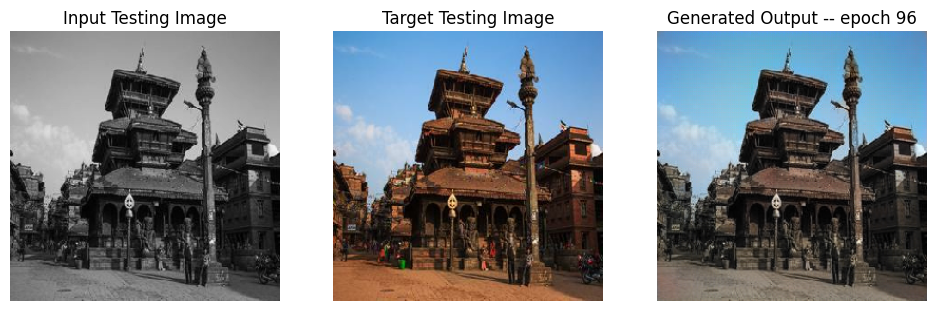

SSIM Score: 0.9084246754646301
PSNR Score: 24.5269775390625


Epoch 97/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 96


Epoch 97/200: 100%|██████████| 245/245 [01:39<00:00,  2.47batches/s]


Training Details
Generator-- total_loss:4.04 gan_loss:0.06 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:4.72 real_loss:3.88 generated_loss:0.84 --- SSIM 0.94 PSNR 25.15
Time taken for epoch 97 is 99.1252372264862 sec
Number of iteration 245



Epoch 97/200: 100%|██████████| 70/70 [01:59<00:00,  1.71s/batches]


Testing Details
Generator-- total_loss:4.80 gan_loss:0.09 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:3.79 real_loss:3.57 generated_loss:0.22 --- SSIM 0.93 PSNR 24.29
Time taken for epoch 97 is 119.64234519004822 sec
Number of iteration 70


Epoch 98/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 97


Epoch 98/200: 100%|██████████| 245/245 [01:38<00:00,  2.48batches/s]


Training Details
Generator-- total_loss:4.03 gan_loss:0.05 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:4.78 real_loss:3.91 generated_loss:0.87 --- SSIM 0.93 PSNR 25.15
Time taken for epoch 98 is 98.6991560459137 sec
Number of iteration 245



Epoch 98/200: 100%|██████████| 70/70 [01:51<00:00,  1.59s/batches]


Testing Details
Generator-- total_loss:4.87 gan_loss:0.07 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:4.02 real_loss:3.82 generated_loss:0.19 --- SSIM 0.92 PSNR 24.13
Time taken for epoch 98 is 111.27884030342102 sec
Number of iteration 70


Epoch 99/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 98


Epoch 99/200: 100%|██████████| 245/245 [01:38<00:00,  2.49batches/s]


Training Details
Generator-- total_loss:4.02 gan_loss:0.05 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:4.77 real_loss:3.94 generated_loss:0.83 --- SSIM 0.93 PSNR 25.16
Time taken for epoch 99 is 98.28541779518127 sec
Number of iteration 245



Epoch 99/200: 100%|██████████| 70/70 [01:50<00:00,  1.58s/batches]


Testing Details
Generator-- total_loss:4.91 gan_loss:0.07 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:3.98 real_loss:3.75 generated_loss:0.23 --- SSIM 0.92 PSNR 24.11
Time taken for epoch 99 is 110.81580328941345 sec
Number of iteration 70


Epoch 100/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 99


Epoch 100/200: 100%|██████████| 245/245 [01:38<00:00,  2.48batches/s]


Training Details
Generator-- total_loss:4.02 gan_loss:0.05 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:4.88 real_loss:3.95 generated_loss:0.93 --- SSIM 0.93 PSNR 25.15
Time taken for epoch 100 is 98.8372654914856 sec
Number of iteration 245



Epoch 100/200: 100%|██████████| 70/70 [01:51<00:00,  1.59s/batches]


Testing Details
Generator-- total_loss:4.82 gan_loss:0.07 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:3.96 real_loss:3.74 generated_loss:0.22 --- SSIM 0.92 PSNR 24.24
Time taken for epoch 100 is 111.64845037460327 sec
Number of iteration 70
Reduced discriminator learning rate to 2.6214402168989184e-07 at epoch 100.


Epoch 101/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 100


Epoch 101/200: 100%|██████████| 245/245 [01:42<00:00,  2.39batches/s]


Training Details
Generator-- total_loss:4.06 gan_loss:0.11 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:4.28 real_loss:3.19 generated_loss:1.09 --- SSIM 0.93 PSNR 25.16
Time taken for epoch 101 is 102.33952212333679 sec
Number of iteration 245



Epoch 101/200: 100%|██████████| 70/70 [01:54<00:00,  1.64s/batches]


Testing Details
Generator-- total_loss:5.00 gan_loss:0.26 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:2.90 real_loss:2.29 generated_loss:0.61 --- SSIM 0.92 PSNR 24.25
Time taken for epoch 101 is 114.88881373405457 sec
Number of iteration 70
Displaying one random test image...


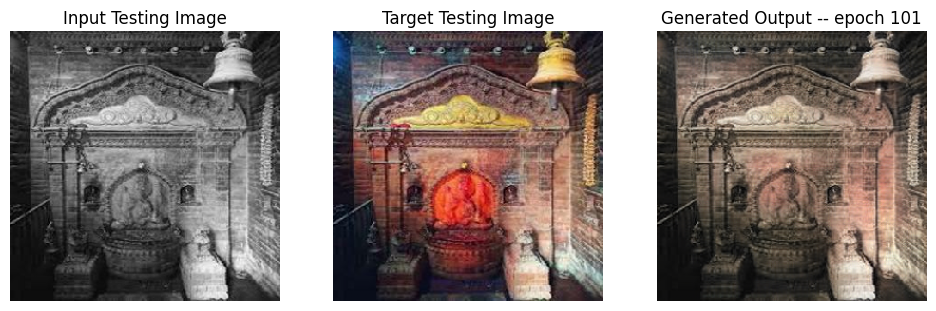

SSIM Score: 0.956636905670166
PSNR Score: 23.076656341552734


Epoch 102/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 101


Epoch 102/200: 100%|██████████| 245/245 [01:42<00:00,  2.39batches/s]


Training Details
Generator-- total_loss:4.24 gan_loss:0.29 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:3.72 real_loss:2.13 generated_loss:1.59 --- SSIM 0.93 PSNR 25.16
Time taken for epoch 102 is 102.46695446968079 sec
Number of iteration 245



Epoch 102/200: 100%|██████████| 70/70 [01:54<00:00,  1.64s/batches]


Testing Details
Generator-- total_loss:5.21 gan_loss:0.48 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:2.51 real_loss:1.64 generated_loss:0.87 --- SSIM 0.92 PSNR 24.26
Time taken for epoch 102 is 114.98782229423523 sec
Number of iteration 70


Epoch 103/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 102


Epoch 103/200: 100%|██████████| 245/245 [01:42<00:00,  2.38batches/s]


Training Details
Generator-- total_loss:4.38 gan_loss:0.41 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:3.45 real_loss:1.73 generated_loss:1.73 --- SSIM 0.93 PSNR 25.14
Time taken for epoch 103 is 102.82354164123535 sec
Number of iteration 245



Epoch 103/200: 100%|██████████| 70/70 [01:55<00:00,  1.65s/batches]


Testing Details
Generator-- total_loss:5.26 gan_loss:0.53 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:2.42 real_loss:1.50 generated_loss:0.93 --- SSIM 0.92 PSNR 24.28
Time taken for epoch 103 is 115.80901408195496 sec
Number of iteration 70


Epoch 104/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 103


Epoch 104/200: 100%|██████████| 245/245 [01:42<00:00,  2.39batches/s]


Training Details
Generator-- total_loss:4.50 gan_loss:0.53 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:3.15 real_loss:1.45 generated_loss:1.70 --- SSIM 0.93 PSNR 25.15
Time taken for epoch 104 is 102.48565077781677 sec
Number of iteration 245



Epoch 104/200: 100%|██████████| 70/70 [01:54<00:00,  1.64s/batches]


Testing Details
Generator-- total_loss:5.32 gan_loss:0.59 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:2.34 real_loss:1.39 generated_loss:0.95 --- SSIM 0.92 PSNR 24.26
Time taken for epoch 104 is 114.98508524894714 sec
Number of iteration 70


Epoch 105/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 104


Epoch 105/200: 100%|██████████| 245/245 [01:42<00:00,  2.39batches/s]


Training Details
Generator-- total_loss:4.57 gan_loss:0.61 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:2.97 real_loss:1.29 generated_loss:1.68 --- SSIM 0.93 PSNR 25.15
Time taken for epoch 105 is 102.31595253944397 sec
Number of iteration 245



Epoch 105/200: 100%|██████████| 70/70 [01:54<00:00,  1.64s/batches]


Testing Details
Generator-- total_loss:5.41 gan_loss:0.68 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:2.26 real_loss:1.23 generated_loss:1.04 --- SSIM 0.92 PSNR 24.28
Time taken for epoch 105 is 114.8024320602417 sec
Number of iteration 70
Reduced generator learning rate to 6.046617636457085e-06 at epoch 105


Epoch 106/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 105


Epoch 106/200: 100%|██████████| 245/245 [01:39<00:00,  2.47batches/s]


Training Details
Generator-- total_loss:4.19 gan_loss:0.11 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:5.00 real_loss:3.22 generated_loss:1.78 --- SSIM 0.93 PSNR 24.91
Time taken for epoch 106 is 99.04481816291809 sec
Number of iteration 245



Epoch 106/200: 100%|██████████| 70/70 [01:51<00:00,  1.60s/batches]


Testing Details
Generator-- total_loss:5.14 gan_loss:0.22 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:3.22 real_loss:2.64 generated_loss:0.59 --- SSIM 0.91 PSNR 23.90
Time taken for epoch 106 is 111.84450078010559 sec
Number of iteration 70
Displaying one random test image...


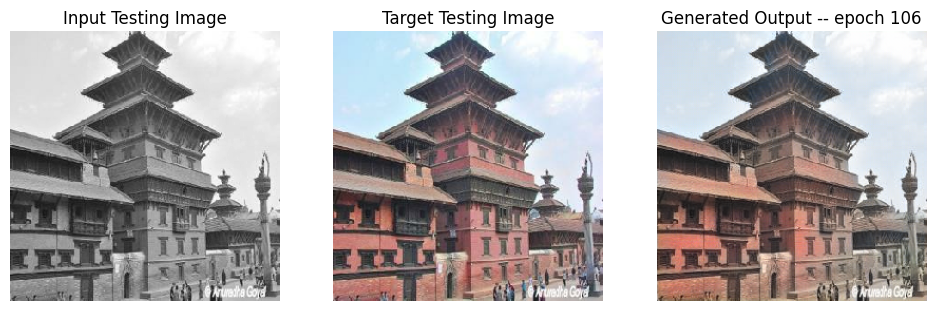

SSIM Score: 0.9649316668510437
PSNR Score: 29.332712173461914


Epoch 107/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 106


Epoch 107/200: 100%|██████████| 245/245 [01:38<00:00,  2.48batches/s]


Training Details
Generator-- total_loss:4.17 gan_loss:0.07 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:5.28 real_loss:3.48 generated_loss:1.80 --- SSIM 0.93 PSNR 24.86
Time taken for epoch 107 is 98.73163771629333 sec
Number of iteration 245



Epoch 107/200: 100%|██████████| 70/70 [01:51<00:00,  1.59s/batches]


Testing Details
Generator-- total_loss:5.12 gan_loss:0.22 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:3.23 real_loss:2.57 generated_loss:0.66 --- SSIM 0.91 PSNR 23.93
Time taken for epoch 107 is 111.62066841125488 sec
Number of iteration 70


Epoch 108/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 107


Epoch 108/200: 100%|██████████| 245/245 [01:38<00:00,  2.48batches/s]


Training Details
Generator-- total_loss:4.17 gan_loss:0.08 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:5.22 real_loss:3.48 generated_loss:1.74 --- SSIM 0.92 PSNR 24.88
Time taken for epoch 108 is 98.64687085151672 sec
Number of iteration 245



Epoch 108/200: 100%|██████████| 70/70 [01:51<00:00,  1.59s/batches]


Testing Details
Generator-- total_loss:4.93 gan_loss:0.16 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:3.48 real_loss:2.88 generated_loss:0.60 --- SSIM 0.91 PSNR 24.17
Time taken for epoch 108 is 111.49294662475586 sec
Number of iteration 70


Epoch 109/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 108


Epoch 109/200: 100%|██████████| 245/245 [01:38<00:00,  2.48batches/s]


Training Details
Generator-- total_loss:4.15 gan_loss:0.07 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:5.29 real_loss:3.51 generated_loss:1.78 --- SSIM 0.92 PSNR 24.89
Time taken for epoch 109 is 98.83545136451721 sec
Number of iteration 245



Epoch 109/200: 100%|██████████| 70/70 [01:59<00:00,  1.70s/batches]


Testing Details
Generator-- total_loss:5.02 gan_loss:0.17 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:3.40 real_loss:2.82 generated_loss:0.59 --- SSIM 0.91 PSNR 24.02
Time taken for epoch 109 is 119.3509292602539 sec
Number of iteration 70


Epoch 110/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 109


Epoch 110/200: 100%|██████████| 245/245 [01:38<00:00,  2.49batches/s]


Training Details
Generator-- total_loss:4.14 gan_loss:0.07 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:5.36 real_loss:3.54 generated_loss:1.82 --- SSIM 0.92 PSNR 24.89
Time taken for epoch 110 is 98.26675152778625 sec
Number of iteration 245



Epoch 110/200: 100%|██████████| 70/70 [01:50<00:00,  1.58s/batches]


Testing Details
Generator-- total_loss:5.14 gan_loss:0.20 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:3.42 real_loss:2.74 generated_loss:0.68 --- SSIM 0.90 PSNR 23.81
Time taken for epoch 110 is 110.75874543190002 sec
Number of iteration 70
Reduced discriminator learning rate to 1.0485761094969349e-07 at epoch 110.


Epoch 111/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 110


Epoch 111/200: 100%|██████████| 245/245 [01:41<00:00,  2.40batches/s]


Training Details
Generator-- total_loss:4.15 gan_loss:0.08 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:5.33 real_loss:3.40 generated_loss:1.92 --- SSIM 0.92 PSNR 24.89
Time taken for epoch 111 is 101.95901989936829 sec
Number of iteration 245



Epoch 111/200: 100%|██████████| 70/70 [01:54<00:00,  1.64s/batches]


Testing Details
Generator-- total_loss:5.12 gan_loss:0.25 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:3.24 real_loss:2.46 generated_loss:0.78 --- SSIM 0.91 PSNR 23.98
Time taken for epoch 111 is 114.92610144615173 sec
Number of iteration 70
Displaying one random test image...


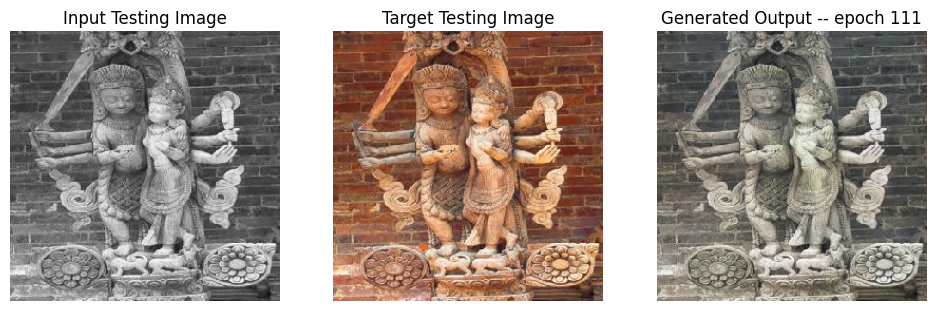

SSIM Score: 0.9380273222923279
PSNR Score: 19.122392654418945


Epoch 112/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 111


Epoch 112/200: 100%|██████████| 245/245 [01:41<00:00,  2.40batches/s]


Training Details
Generator-- total_loss:4.18 gan_loss:0.10 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:5.10 real_loss:3.15 generated_loss:1.95 --- SSIM 0.92 PSNR 24.87
Time taken for epoch 112 is 101.99065732955933 sec
Number of iteration 245



Epoch 112/200: 100%|██████████| 70/70 [01:54<00:00,  1.64s/batches]


Testing Details
Generator-- total_loss:5.18 gan_loss:0.32 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:3.10 real_loss:2.21 generated_loss:0.89 --- SSIM 0.91 PSNR 24.00
Time taken for epoch 112 is 114.6426351070404 sec
Number of iteration 70


Epoch 113/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 112


Epoch 113/200: 100%|██████████| 245/245 [01:42<00:00,  2.40batches/s]


Training Details
Generator-- total_loss:4.20 gan_loss:0.12 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:4.98 real_loss:2.95 generated_loss:2.02 --- SSIM 0.92 PSNR 24.87
Time taken for epoch 113 is 102.09191060066223 sec
Number of iteration 245



Epoch 113/200: 100%|██████████| 70/70 [01:54<00:00,  1.64s/batches]


Testing Details
Generator-- total_loss:5.21 gan_loss:0.36 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:3.01 real_loss:2.04 generated_loss:0.98 --- SSIM 0.91 PSNR 24.03
Time taken for epoch 113 is 114.76031470298767 sec
Number of iteration 70


Epoch 114/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 113


Epoch 114/200: 100%|██████████| 245/245 [01:42<00:00,  2.39batches/s]


Training Details
Generator-- total_loss:4.23 gan_loss:0.16 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:4.91 real_loss:2.71 generated_loss:2.20 --- SSIM 0.92 PSNR 24.89
Time taken for epoch 114 is 102.57906937599182 sec
Number of iteration 245



Epoch 114/200: 100%|██████████| 70/70 [01:55<00:00,  1.65s/batches]


Testing Details
Generator-- total_loss:5.28 gan_loss:0.45 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:2.89 real_loss:1.80 generated_loss:1.09 --- SSIM 0.91 PSNR 24.03
Time taken for epoch 114 is 115.27410888671875 sec
Number of iteration 70


Epoch 115/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 114


Epoch 115/200: 100%|██████████| 245/245 [01:42<00:00,  2.38batches/s]


Training Details
Generator-- total_loss:4.26 gan_loss:0.19 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:4.71 real_loss:2.50 generated_loss:2.21 --- SSIM 0.92 PSNR 24.87
Time taken for epoch 115 is 102.74069118499756 sec
Number of iteration 245



Epoch 115/200: 100%|██████████| 70/70 [01:55<00:00,  1.65s/batches]


Testing Details
Generator-- total_loss:5.28 gan_loss:0.44 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:2.88 real_loss:1.79 generated_loss:1.09 --- SSIM 0.91 PSNR 24.03
Time taken for epoch 115 is 115.4124915599823 sec
Number of iteration 70
Reduced generator learning rate to 3.6279706364439334e-06 at epoch 115


Epoch 116/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 115


Epoch 116/200: 100%|██████████| 245/245 [01:38<00:00,  2.48batches/s]


Training Details
Generator-- total_loss:4.24 gan_loss:0.10 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:5.36 real_loss:3.12 generated_loss:2.23 --- SSIM 0.92 PSNR 24.76
Time taken for epoch 116 is 98.73291563987732 sec
Number of iteration 245



Epoch 116/200: 100%|██████████| 70/70 [01:51<00:00,  1.60s/batches]


Testing Details
Generator-- total_loss:5.17 gan_loss:0.32 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:3.12 real_loss:2.18 generated_loss:0.94 --- SSIM 0.91 PSNR 24.03
Time taken for epoch 116 is 111.72048425674438 sec
Number of iteration 70
Displaying one random test image...


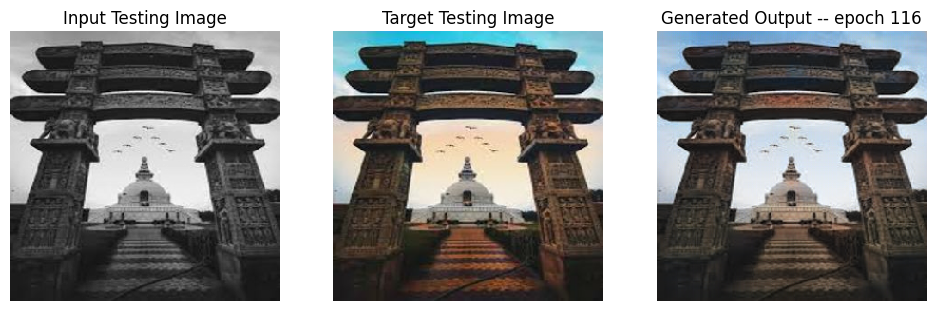

SSIM Score: 0.9586192965507507
PSNR Score: 25.177846908569336


Epoch 117/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 116


Epoch 117/200: 100%|██████████| 245/245 [01:38<00:00,  2.48batches/s]


Training Details
Generator-- total_loss:4.21 gan_loss:0.08 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:5.50 real_loss:3.34 generated_loss:2.16 --- SSIM 0.92 PSNR 24.78
Time taken for epoch 117 is 98.76790952682495 sec
Number of iteration 245



Epoch 117/200: 100%|██████████| 70/70 [01:51<00:00,  1.60s/batches]


Testing Details
Generator-- total_loss:5.15 gan_loss:0.27 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:3.21 real_loss:2.36 generated_loss:0.85 --- SSIM 0.90 PSNR 23.97
Time taken for epoch 117 is 111.73264193534851 sec
Number of iteration 70


Epoch 118/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 117


Epoch 118/200: 100%|██████████| 245/245 [01:39<00:00,  2.46batches/s]


Training Details
Generator-- total_loss:4.21 gan_loss:0.08 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:5.53 real_loss:3.31 generated_loss:2.22 --- SSIM 0.92 PSNR 24.78
Time taken for epoch 118 is 99.58048725128174 sec
Number of iteration 245



Epoch 118/200: 100%|██████████| 70/70 [01:52<00:00,  1.60s/batches]


Testing Details
Generator-- total_loss:5.07 gan_loss:0.24 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:3.41 real_loss:2.51 generated_loss:0.90 --- SSIM 0.91 PSNR 24.08
Time taken for epoch 118 is 112.1450080871582 sec
Number of iteration 70


Epoch 119/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 118


Epoch 119/200: 100%|██████████| 245/245 [01:38<00:00,  2.48batches/s]


Training Details
Generator-- total_loss:4.19 gan_loss:0.08 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:5.55 real_loss:3.34 generated_loss:2.20 --- SSIM 0.92 PSNR 24.81
Time taken for epoch 119 is 98.69998812675476 sec
Number of iteration 245



Epoch 119/200: 100%|██████████| 70/70 [01:51<00:00,  1.59s/batches]


Testing Details
Generator-- total_loss:5.18 gan_loss:0.29 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:3.24 real_loss:2.29 generated_loss:0.94 --- SSIM 0.90 PSNR 23.92
Time taken for epoch 119 is 111.26913332939148 sec
Number of iteration 70


Epoch 120/200:   0%|          | 0/70 [00:00<?, ?batches/s]

Epoch 119


Epoch 120/200: 100%|██████████| 245/245 [01:39<00:00,  2.47batches/s]


Training Details
Generator-- total_loss:4.19 gan_loss:0.08 l1_loss:0.03 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:5.65 real_loss:3.36 generated_loss:2.29 --- SSIM 0.92 PSNR 24.79
Time taken for epoch 120 is 99.244544506073 sec
Number of iteration 245



Epoch 120/200: 100%|██████████| 70/70 [01:51<00:00,  1.60s/batches]


Testing Details
Generator-- total_loss:5.16 gan_loss:0.26 l1_loss:0.04 l2_loss:0.00 perceptual_loss:0.00 Discriminator-- total_loss:3.35 real_loss:2.48 generated_loss:0.87 --- SSIM 0.90 PSNR 23.89
Time taken for epoch 120 is 111.87471103668213 sec
Number of iteration 70
Discriminator learning rate already at the minimum. Stopping training.


In [43]:
fit(train_dataset, epochs, test_dataset, gen)

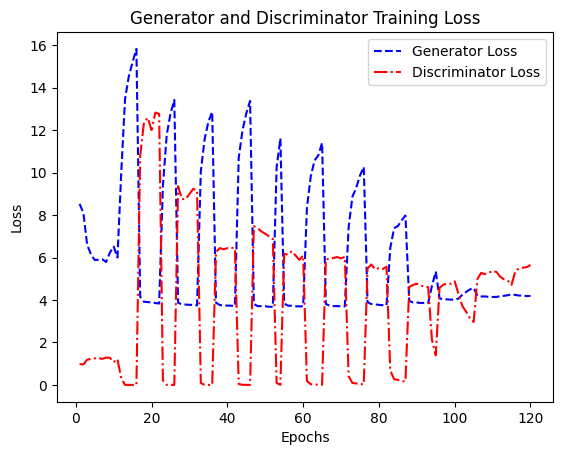

In [44]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_losses, '--b', label='Generator Loss')
plt.plot(epochs, train_discriminator_losses, '-.r', label='Discriminator Loss')
plt.title('Generator and Discriminator Training Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/train_loss_plot_1.png')
plt.show()

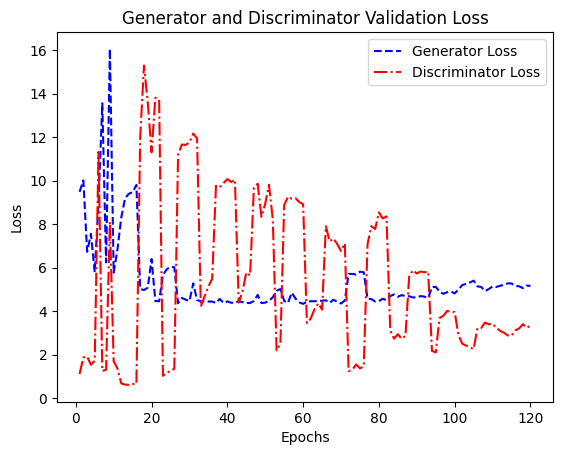

In [45]:
epochs = range(1, len(test_generator_losses) + 1)

plt.plot(epochs, test_generator_losses, '--b', label='Generator Loss')
plt.plot(epochs, test_discriminator_losses, '-.r', label='Discriminator Loss')
plt.title('Generator and Discriminator Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/test_loss_plot_1.png')
plt.show()

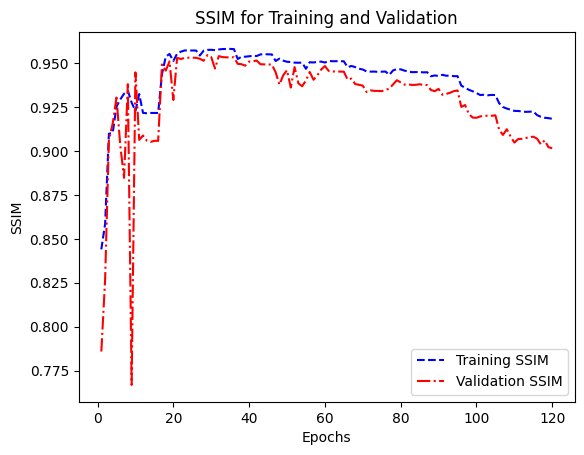

In [46]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_ssim, '--b', label='Training SSIM')
plt.plot(epochs, testing_ssim, '-.r', label='Validation SSIM')
plt.title('SSIM for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('SSIM')
plt.legend()
plt.savefig('/kaggle/working/SSIM_plot_1.png')
plt.show()

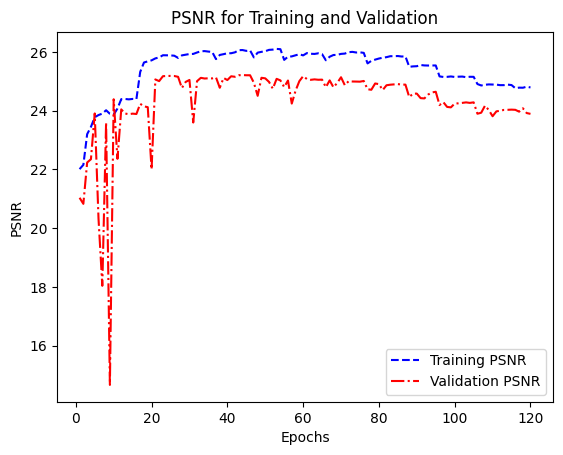

In [47]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_psnr, '--b', label='Training PSNR')
plt.plot(epochs, testing_psnr, '-.r', label='Validation PSNR')
plt.title('PSNR for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('PSNR')
plt.legend()
plt.savefig('/kaggle/working/PSNR_plot_1.png')
plt.show()

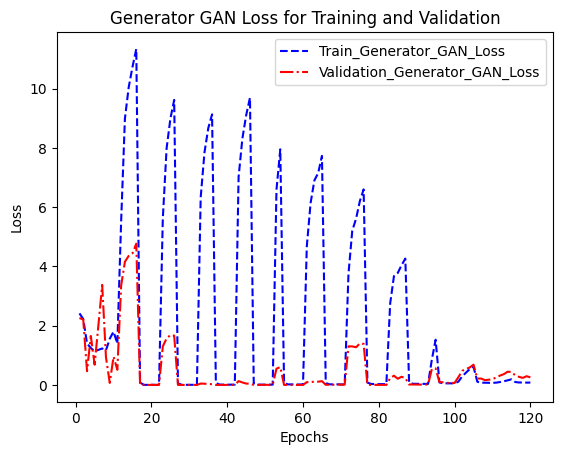

In [48]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_gan_losses, '--b', label='Train_Generator_GAN_Loss')
plt.plot(epochs, test_generator_gan_losses, '-.r', label='Validation_Generator_GAN_Loss')
plt.title('Generator GAN Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_GAN_plot_1.png')
plt.show()

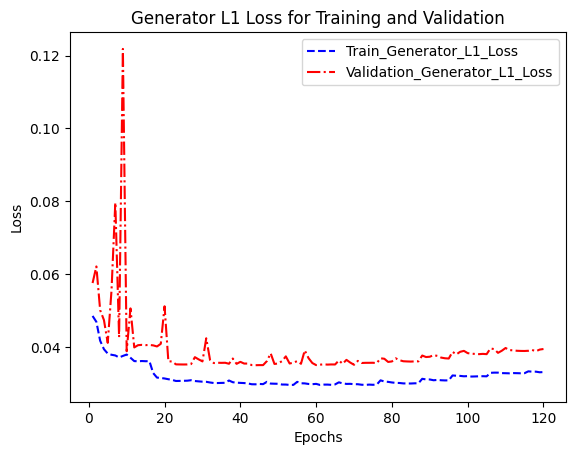

In [49]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_l1_losses, '--b', label='Train_Generator_L1_Loss')
plt.plot(epochs, test_generator_l1_losses, '-.r', label='Validation_Generator_L1_Loss')
plt.title('Generator L1 Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_L1_plot_1.png')
plt.show()

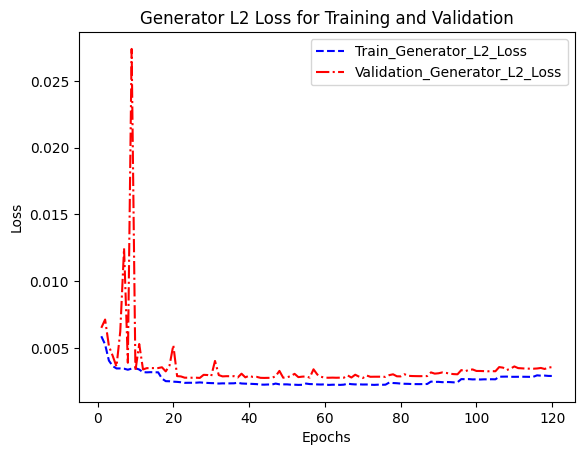

In [50]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_l2_losses, '--b', label='Train_Generator_L2_Loss')
plt.plot(epochs, test_generator_l2_losses, '-.r', label='Validation_Generator_L2_Loss')
plt.title('Generator L2 Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_L2_plot_1.png')
plt.show()

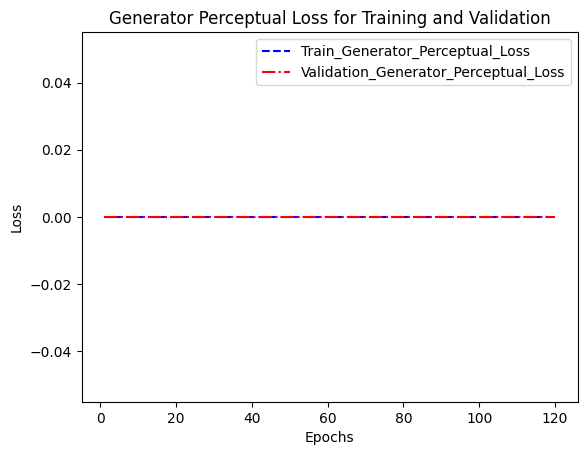

In [51]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_perceptual_losses, '--b', label='Train_Generator_Perceptual_Loss')
plt.plot(epochs, test_generator_perceptual_losses, '-.r', label='Validation_Generator_Perceptual_Loss')
plt.title('Generator Perceptual Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_Perceptual_plot_1.png')
plt.show()

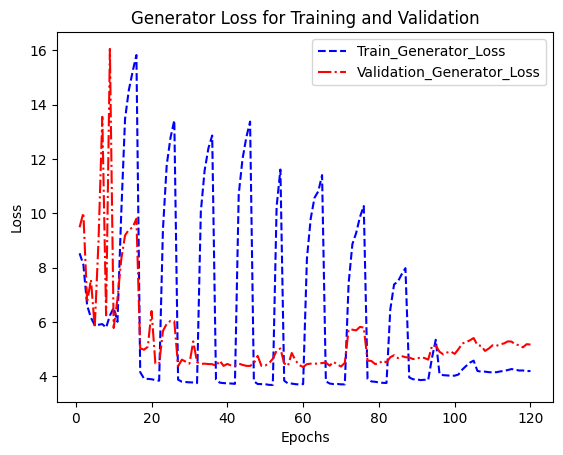

In [52]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_losses, '--b', label='Train_Generator_Loss')
plt.plot(epochs, test_generator_losses, '-.r', label='Validation_Generator_Loss')
plt.title('Generator Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_plot_1.png')
plt.show()

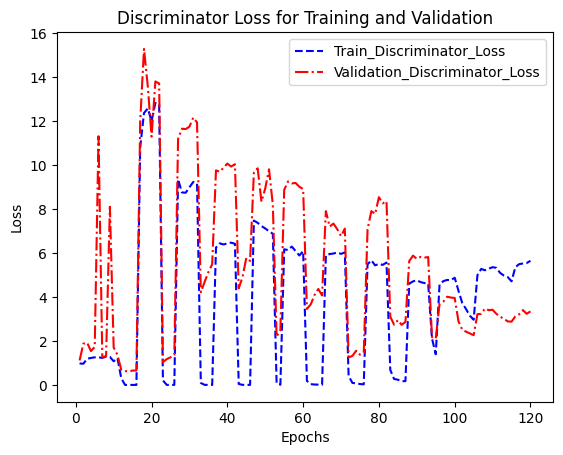

In [53]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_losses, '--b', label='Train_Discriminator_Loss')
plt.plot(epochs, test_discriminator_losses, '-.r', label='Validation_Discriminator_Loss')
plt.title('Discriminator Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_plot_1.png')
plt.show()

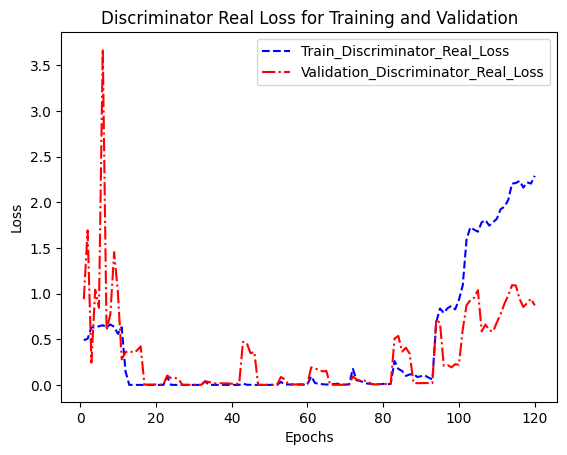

In [54]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_real_losses, '--b', label='Train_Discriminator_Real_Loss')
plt.plot(epochs, test_discriminator_real_losses, '-.r', label='Validation_Discriminator_Real_Loss')
plt.title('Discriminator Real Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_Real_plot_1.png')
plt.show()

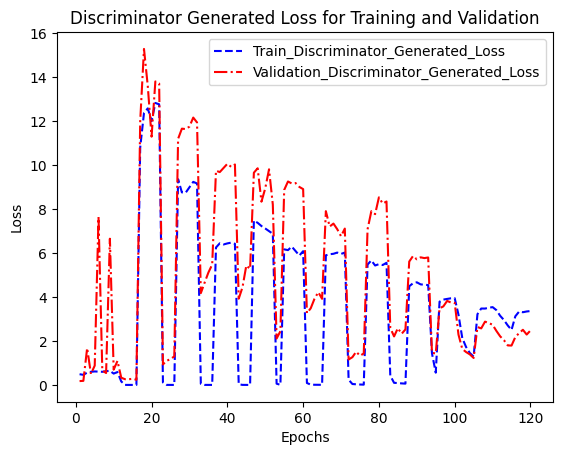

In [55]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_generated_losses, '--b', label='Train_Discriminator_Generated_Loss')
plt.plot(epochs, test_discriminator_generated_losses, '-.r', label='Validation_Discriminator_Generated_Loss')
plt.title('Discriminator Generated Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_Generated_plot_1.png')
plt.show()

In [56]:
import csv
with open('/kaggle/working/dataJan20.csv','w', newline='') as file:
    writer = csv.writer(file)
    writer.writerows(all_records)

In [57]:
os.mkdir('/kaggle/working/modelsJan20')

In [58]:
gen.save('/kaggle/working/modelsJan20/gen.h5')
gen.save_weights('/kaggle/working/modelsJan20/gen.keras')
disc.save('/kaggle/working/modelsJan20/disc.h5')
disc.save_weights('/kaggle/working/modelsJan20/disc.keras')

/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [59]:
def download_file(path, download_file_name):
    os.chdir('/kaggle/working/')
    zip_name = f"/kaggle/working/{download_file_name}.zip"
    command = f"zip {zip_name} {path} -r"
    result = subprocess.run(command, shell=True, capture_output=True, text=True)
    if result.returncode !=0:
        print("Unable to run zip command")
        print(result.stderr)
        return
    display(FileLink(f'{download_file_name}.zip'))

In [60]:
import subprocess
from IPython.display import FileLink, display

In [61]:
download_file('/kaggle/working', 'outputJan20')

/kaggle/working/outputJan20.zip